<div align="center">
  <h1></h1>
  <h1>Universidad Nacional de Colombia</h1>
  <h2>Procesamiento del lenguaje natural</h2>
  <h2>Proyecto</h2>
  <h2>Dr Diomedes:
  <h3>Un Bot con sentimiento</h3>
  <h3>Grupo 1</h3>
  <strong>Estudiantes:</strong>  <br>
  Jhojan Sebastian Arango Castillo (<a href="mailto:jsarangoca@unal.edu.co">jsarangoca@unal.edu.co</a>) <br>
  Diego Andres Benitez Duarte (<a href="mailto:dabenitezd@unal.edu.co">dabenitezd@unal.edu.co</a>) <br>
  Jeraldine Muñoz Alvarado (<a href="mailto:jemunozal@unal.edu.co">jemunozal@unal.edu.co</a>) <br>
  Johan Sebastian Suarez Sepulveda (<a href="mailto:jemunozal@unal.edu.co">jssuarezse@unal.edu.co</a>) <br>
  <strong>Profesora:</strong> Elizabeth León Guzmán
</div>

# Carga y limpieza de datos


## Carga del archivo csv, obtencion de dos columnas con el nombre de la cancion y su letra

In [ ]:
!pip install gensim
!pip -q install rapidfuzz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.9/27.9 MB 26.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 19.9 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import unicodedata
from rapidfuzz import fuzz, process
# Se importan las librerías
np.random.seed(0)
import json, nltk
import string
from nltk.corpus import stopwords
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture

In [ ]:
df = pd.read_csv("letras_musica_com_estructuradas_por_lineas.csv", usecols=['nombre_cancion', 'letra_completa'],
                     sep=None, engine='python', encoding='utf-8')
df.shape

(424, 2)

In [ ]:
df.head()

,nombre_cancion,letra_completa
0,26 de mayo,el veintiséis del mes de mayo nació un niñito ...
1,A mi papá,voy a componé un merengue voy a componé un mer...
2,A un cariño del alma,cuando se acaban todas las palabras y ni siqui...
3,A un colega,de una manera especial y en una forma correcta...
4,A Un Ladito Del Camino,hoy me siento enamorado por eso he venido a ve...


Una vez se carga el CSV, se eliminan filas nulas y luego aplica un primer filtro de duplicados. La función `normaliza_letra` convierte todo a minúsculas, elimina tildes (unicodedata.normalize) y quita puntuación (re.sub). Luego, drop_duplicates(subset=["letra_norm"]) elimina canciones cuya letra normalizada es exactamente idéntica.

Es importan realizar la eliminación de canciones que son casi idénticas (ej. >85% de similitud), como versiones "en vivo", remixes, o letras con pequeños errores de transcripción. Para esto se usa `fuzz.token_set_ratio`, siendo que este método tokeniza ambas letras, encuentra las palabras comunes, y compara la intersección con el resto. Es robusto a cambios en el orden de las palabras y a repeticiones.

En lugar de comparar cada canción con todas las demás (lo cual sería $O(n^2)$ y muy lento), se usa una estructura de datos clásica llamada Union-Find. Para lo que vamos a imaginar cada canción como una isla. Cada isla es su propia "capital" (raíz). Se itera sobre cada canción hasta encontrar todas las otras canciones que son >85% similares. Para cada par similar, se construye un puente entre sus islas. El algoritmo fusiona sus conjuntos, asignando una capital a la otra. Al final, todas las canciones que están conectadas directa o indirectamente pertenecen al misma conjunto. Entonces, se agrupan todas las canciones  y de cada grupo, se selecciona un único representante, siendo este la canción con la letra más larga, asumiendo que es la versión más completa.


In [ ]:
# limpiar nulos y normalizar texto
df = df.dropna(subset=['nombre_cancion', 'letra_completa']).copy()
df['nombre_cancion'] = df['nombre_cancion'].astype(str).str.strip()

def normaliza_letra(s: str) -> str:
    if pd.isna(s):
        return ""
    s = str(s).lower()
    # quitar tildes
    s = unicodedata.normalize("NFKD", s)
    s = "".join(ch for ch in s if not unicodedata.combining(ch))
    # quitar puntuación y dejar solo letras/números/espacios
    s = re.sub(r"[^\w\s]", " ", s)
    # colapsar espacios
    s = re.sub(r"\s+", " ", s).strip()
    return s

# 1) Normaliza y dedup EXACTO
df = df.dropna(subset=["letra_completa"]).copy()
df["letra_norm"] = df["letra_completa"].apply(normaliza_letra)
df_exact = df.drop_duplicates(subset=["letra_norm"], keep="first").reset_index(drop=True)


# --- Paso B: agrupar NEAR-DUPLICATES con RapidFuzz ---
#     Umbral: sube a 97 para ser más estricto, baja a 90 para ser más permisivo
THRESH = 85
letras = df["letra_norm"].tolist()
n = len(letras)
# Union-Find para agrupar índices con similitud alta
parent = list(range(n))
def find(a):
    while parent[a] != a:
        parent[a] = parent[parent[a]]
        a = parent[a]
    return a
def union(a, b):
    ra, rb = find(a), find(b)
    if ra != rb:
        parent[rb] = ra

# Para cada letra, buscamos matches dentro del propio conjunto (≥ THRESH)
for i, s in enumerate(letras):
    matches = process.extract(
        s, letras,
        scorer=fuzz.token_set_ratio,   # robusto a reordenamiento y repeticiones
        score_cutoff=THRESH,
        limit=None
    )
    for _, score, j in matches:
        if j == i:
            continue
        union(i, j)

# Construir grupos por raíz
groups = {}
for i in range(n):
    r = find(i)
    groups.setdefault(r, []).append(i)

# Elegir representante por grupo (la letra MÁS LARGA, suele ser la más completa)
df["len_letra"] = df["letra_completa"].str.len()
keep_idx = []
for idxs in groups.values():
    rep = max(idxs, key=lambda k: df.loc[k, "len_letra"])
    keep_idx.append(rep)

keep_mask = np.zeros(n, dtype=bool)
keep_mask[keep_idx] = True

df_sin_dups = (df[keep_mask]
               .drop(columns=["letra_norm", "len_letra"])
               .reset_index(drop=True))

# (Opcional) canciones eliminadas para revisar
dups_removidos = (df[~keep_mask]
                  [["nombre_cancion", "letra_completa"]].copy())

def preview(s, n=120):
    s = (s or "").replace("\n", " ")
    return s[:n] + ("…" if len(s) > n else "")

rows = []
for root, idxs in groups.items():
    # representante (el que mantuviste: letra más larga)
    rep = max(idxs, key=lambda k: df.loc[k, "len_letra"])
    for j in idxs:
        if j == rep:
            continue
        rows.append({
            "grupo_id": int(root),
            "kept_idx": int(rep),
            "kept_nombre": df.loc[rep, "nombre_cancion"],
            "kept_len": int(df.loc[rep, "len_letra"]),
            "drop_idx": int(j),
            "drop_nombre": df.loc[j, "nombre_cancion"],
            "drop_len": int(df.loc[j, "len_letra"]),
            "sim_token_set": fuzz.token_set_ratio(df.loc[rep, "letra_norm"], df.loc[j, "letra_norm"]),
            "kept_preview": preview(df.loc[rep, "letra_completa"]),
            "drop_preview": preview(df.loc[j, "letra_completa"]),
        })

pairs_df = pd.DataFrame(rows).sort_values(["grupo_id", "kept_idx", "drop_idx"]).reset_index(drop=True)
for _, r in pairs_df.iterrows():
    print(f"[Grupo {r.grupo_id}] KEEP: {r.kept_nombre} ({r.kept_len}) "
          f"| DROP: {r.drop_nombre} ({r.drop_len}) "
          f"| sim={r.sim_token_set:.1f}")
    print(f"   KEEP: {r.kept_preview}")
    print(f"   DROP: {r.drop_preview}\n")

df = df_sin_dups

[Grupo 10] KEEP: Algo de tu parte (1638) | DROP: Pon Algo De Tu Parte (1638) | sim=100.0
   KEEP: destino porqué nublas mis ojos destino porqué nublas mis ojos yo no sé como voy a vivir si a la mujer que quiero y adoro…
   DROP: destino porqué nublas mis ojos destino porqué nublas mis ojos yo no sé como voy a vivir si a la mujer que quiero y adoro…

[Grupo 33] KEEP: Bonita (1802) | DROP: Oye bonta (1279) | sim=96.1
   KEEP: oye bonita cuando me estas mirando yo siento que mi vida cubre todo tu cuerpo yo siento que mi vida cubre todo tu cuerpo…
   DROP: oye bonita cuando me estas mirando yo siento que tu vida cubre todo tu cuerpo oye bonita me siento tan contento y en el …

[Grupo 36] KEEP: Buenas tardes (641) | DROP: Perro sinvergüenza (641) | sim=100.0
   KEEP: al ver llegar el sol llego la tarde y me dijo buenas tardes como esta pero sabe no me puedo quedar y así como la tarde l…
   DROP: al ver llegar el sol llego la tarde y me dijo buenas tardes como esta pero sabe no me puedo qued

In [ ]:
display(df.head())
df.shape

,nombre_cancion,letra_completa
0,26 de mayo,el veintiséis del mes de mayo nació un niñito ...
1,A mi papá,voy a componé un merengue voy a componé un mer...
2,A un cariño del alma,cuando se acaban todas las palabras y ni siqui...
3,A un colega,de una manera especial y en una forma correcta...
4,A Un Ladito Del Camino,hoy me siento enamorado por eso he venido a ve...


(404, 2)

In [ ]:
# limpiar nulos y normalizar texto
df = df.dropna(subset=['nombre_cancion', 'letra_completa']).copy()
df['nombre_cancion'] = df['nombre_cancion'].astype(str).str.strip()
df['letra_completa'] = df['letra_completa'].astype(str).str.strip().str.lower()

## Limpieza de stop words


Se aplica una función de limpieza, `limpiar_texto`, diseñada para preparar los datos para la vectorización. Esta función elimina puntuación, números y stopwords (palabras de alta frecuencia y bajo contenido semántico como 'el', 'la', 'de'). Se tiene la precaución de conservar un conjunto de palabras_relevantes (ej. 'nunca', 'siempre') que, aunque comunes, sí poseen una carga semántica y afectiva importante para el análisis.

In [ ]:
# Descargar stopwords en español (solo la primera vez)
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
# Creamos una lista de stopwords base en español
stop_words = set(stopwords.words('spanish'))

# Opcional: eliminar algunas palabras que sí tienen valor afectivo
palabras_relevantes = {'más', 'menos', 'nunca', 'siempre', 'nadie', 'nada'}
stop_words = stop_words - palabras_relevantes

def limpiar_texto(texto):
    # Si el valor no es string, lo convierte en cadena vacía
    if not isinstance(texto, str):
        return ""
    texto = texto.lower()                                 # minúsculas
    texto = re.sub(f"[{string.punctuation}]", "", texto)  # quitar signos
    texto = re.sub(r"\d+", "", texto)                     # quitar números
    texto = re.sub(r"\s+", " ", texto).strip()            # espacios múltiples
    palabras = [p for p in texto.split() if p not in stop_words]
    return " ".join(palabras)

# Aplicar a la columna
df['frase_limpia'] = df['letra_completa'].apply(limpiar_texto)

display(df[['letra_completa', 'frase_limpia']].head())

,letra_completa,frase_limpia
0,el veintiséis del mes de mayo nació un niñito ...,veintiséis mes mayo nació niñito año cincuenta...
1,voy a componé un merengue voy a componé un mer...,voy componé merengue voy componé merengue pa c...
2,cuando se acaban todas las palabras y ni siqui...,acaban todas palabras siquiera puedes reprocha...
3,de una manera especial y en una forma correcta...,manera especial forma correcta querido homenaj...
4,hoy me siento enamorado por eso he venido a ve...,hoy siento enamorado venido verte aunque veas ...


## Tokenizacion y Word2vec

Se tokenizan las letras limpias y se entrena un modelo Word2Vec desde cero, usando todo el corpus de canciones. El modelo es CBOW (Continuous Bag of Words), que aprende a predecir una palabra en función de su contexto (las 5 palabras circundantes).

El resultado es un embedding de 100 dimensiones para cada palabra del vocabulario. Palabras con significados similares tendrán vectores que apuntan en direcciones similares en este espacio de 100 dimensiones.

Para obtener un vector por canción, la función `song_vec` implementa una estrategia de agregación por promedio: calcula la media aritmética de los vectores de todas las palabras presentes en la letra de una canción.

In [ ]:
from gensim.models import word2vec
# --- 2) Tokenización ---
wpt = nltk.WordPunctTokenizer()
df['tokens'] = df['frase_limpia'].apply(
    lambda s: [t for t in wpt.tokenize(s) if t.strip()]
)

In [ ]:
# --- 3) Entrenar Word2Vec ---
w2v_model = word2vec.Word2Vec(
    sentences=df['tokens'].tolist(),
    vector_size=100,      # 100 dims
    window=5,             # ventana
    min_count=1,          # incluir todas las palabras
    sample=1e-3,          # subsampling
    sg=0,                 # 0=CBOW, 1=Skip-gram
    epochs=200,
    workers=4,
    seed=42
)

In [ ]:
# =============================
# 3) Embeddings de frases y agregación por canción
# =============================

def song_vec(tokens, model):
    vocab = model.wv.key_to_index
    keep = [w for w in tokens if w in vocab]
    if not keep:
        return np.zeros(model.vector_size, dtype=float)
    return np.mean(model.wv[keep], axis=0)

df['vec'] = df['tokens'].apply(lambda toks: song_vec(toks, w2v_model))

# Matriz X (n_canciones x 100) y lista de nombres para clustering/tsne
song_names = df['nombre_cancion'].tolist()
X = np.vstack(df['vec'].values)

print(f"Songs: {len(song_names)} | X shape: {X.shape}")  # p.ej., (N, 100)

Songs: 404 | X shape: (404, 100)


## TSNE y visualizacion

La matriz resultante X  se normaliza. Matemáticamente, cada vector $\vec{v}$ es dividido por su magnitud Euclideana: $\vec{v}_{norm} = \frac{\vec{v}}{\| \vec{v} \|_2}$.

Esto transforma cada vector en un vector unitario (longitud 1), eliminando el efecto de la longitud de la canción y forzando a los modelos a centrarse solo en la dirección (el significado). Esto hace que la similitud del coseno sea la métrica de distancia apropiada. Para visualizar estos datos de 100 dimensiones, se utiliza t-SNE, teniendo que esta es una técnica de reducción de dimensionalidad no lineal que proyecta los datos a 2D, intentando preservar las relaciones de vecindad locales. Las agrupaciones visibles en el gráfico t-SNE sugieren la existencia de una estructura de clusters.

In [ ]:
# =============================
# 4) t-SNE sobre canciones
# =============================
# Perplejidad segura (t-SNE requiere n_samples > 3 * perplexity)
from sklearn.manifold import TSNE
n_songs = X.shape[0]
perplexity = max(5, min(30, (n_songs - 1) // 3 if n_songs > 10 else n_songs - 1))

tsne = TSNE(
    n_components=2,
    perplexity=perplexity,
    learning_rate='auto',
    init='random',
    random_state=42,
)
X_2d = tsne.fit_transform(X)

In [ ]:
# =============================
# 5) Visualización (cada punto = canción)
# =============================
import numpy as np
import matplotlib.pyplot as plt

plt.style.use('ggplot')  # fondo gris + grid claro
plt.rcParams.update({
    'figure.dpi': 120,        # más nítido
    'font.size': 11,          # tamaño base de fuente
    'axes.titlesize': 14,
    'axes.labelsize': 12,
})

T = X_2d                 # (n_canciones x 2) obtenido del t-SNE
titles = song_names      # lista de nombres de canción (en el mismo orden que T)

def plot_tsne_songs(T, titles, n_docs=100, seed=7, color='indianred'):
    """
    T: np.ndarray de shape (n, 2) con las coords t-SNE.
    titles: lista de longitud n con los nombres de canciones.
    n_docs: cuántas canciones etiquetar (si chosen es None).
    seed: semilla para muestreo reproducible.
    chosen: lista opcional de canciones específicas a etiquetar.
    """
    titles = np.array(titles)
    n = len(titles)
    n_docs = max(1, min(n_docs, n))
    idx = np.arange(n)
    rng = np.random.default_rng(seed)
    valid_idx = rng.choice(idx, replace=False, size=n_docs)

    plt.figure(figsize=(15, 15))
    plt.scatter(T[:, 0], T[:, 1], s=18, alpha=0.35, c=color, edgecolors='none')
    viz_titles = titles[valid_idx]
    for lbl, x, y in zip(viz_titles, T[valid_idx, 0], T[valid_idx, 1]):
        plt.annotate(lbl, xy=(x, y), xytext=(0, 0), textcoords='offset points', fontsize=8)

    plt.grid(True, alpha=0.2)
    plt.xlabel("TSNE-1"); plt.ylabel("TSNE-2")
    plt.title("t-SNE de canciones (Word2Vec → promedio por canción)")
    plt.tight_layout()
    plt.show()


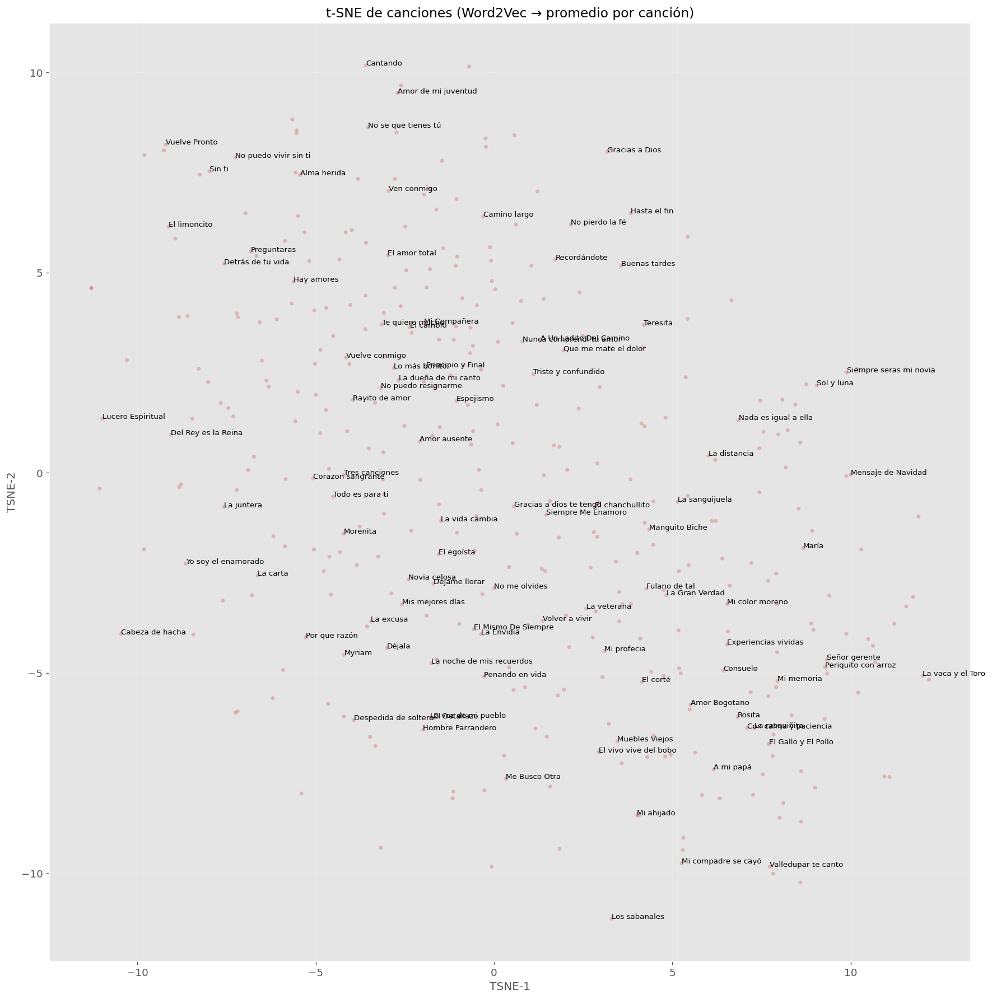

In [ ]:
# --- Ejemplos de uso ---
plot_tsne_songs(T, titles, n_docs=100, seed=7)

# Clustering usando word2vec

El primer enfoque de clustering agrupa las canciones basándose en su significado semántico latente. El objetivo es que canciones que hablan de temas similares (ej. "despecho") queden agrupadas, incluso si no usan exactamente las mismas palabras. Se aplica una serie de 7 algoritmos de clustering sobre la matriz normalizada $X_n$.



## Spectral clustering

Este algoritmo trata los datos como un grafo de similitud (nodos=canciones, aristas=similitud), para lo que calcula la matriz  de este grafo y realiza el clustering sobre sus vectores propios. La K óptima se encuentra maximizando el silhouette_score.

In [ ]:
# =============================
# 1) Spectral Clustering
#    Eleccion de K por silueta
# =============================

from sklearn.preprocessing import normalize
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import silhouette_score


Xn = normalize(X, norm='l2', axis=1)

best = {"score": -1, "K": None, "gamma": None, "labels": None}
for gamma in [0.1, 0.5, 1.0, 2.0]:
    for K in range(2, 100):
        sc = SpectralClustering(n_clusters=K, affinity='rbf', gamma=gamma,
                                assign_labels='kmeans', random_state=42)
        labels = sc.fit_predict(Xn)
        s = silhouette_score(Xn, labels, metric='cosine')
        if s > best["score"]:
            best.update({"score": s, "K": K, "gamma": gamma, "labels": labels})

print(f"Mejor combinación (RBF): K={best['K']}, gamma={best['gamma']} (silhouette={best['score']:.3f})")
labels_spec = best["labels"]

Mejor combinación (RBF): K=2, gamma=2.0 (silhouette=0.237)


## Affinity Propagation

Este es un algoritmo de paso de mensajes que no requiere un K predefinido, sino que encuentra centroides para definir un K automáticamente.

In [ ]:
# =========================================================
# 2) Clustering con Affinity Propagation (precomputed)
# =========================================================
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import DBSCAN, AffinityPropagation
# AP necesita una matriz de similitud: usamos coseno

S = cosine_similarity(Xn)                      # similitud en [-1, 1]
pref = np.median(S)                            # controla #clusters
ap = AffinityPropagation(affinity='precomputed', damping=0.9,
                         preference=pref, random_state=42)
labels_ap = ap.fit_predict(S)

n_clusters_ap = len(np.unique(labels_ap))
print(f"[AffinityPropagation] clusters: {n_clusters_ap}")

[AffinityPropagation] clusters: 38


## Birch

Se trata de un algoritmo rápido y eficiente en memoria que construye un CF-Tree (Árbol de Características de Clustering). En lugar de almacenar todos los puntos, almacena subclusters en las hojas del árbol, sobre los cuales realiza el clustering final.

In [ ]:
# =============================
# 3) BIRCH
#    Usamos K del affinity propagation
# =============================
from sklearn.cluster import Birch, KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

def birch_target_k(Xn, target_k, thresholds=(0.3, 0.4, 0.5, 0.6, 0.8, 1.0),
                   branching_factor=50):
    best = {"score": -1, "thr": None, "labels": None, "model": None}
    for thr in thresholds:
        # Paso 1: construir CF tree y ver cuántos sub-clusters hay
        bir = Birch(threshold=thr, branching_factor=branching_factor, n_clusters=None)
        bir.fit(Xn)
        m = bir.subcluster_centers_.shape[0]
        if m < target_k:
            # con este threshold no alcanza para particionar en K clusters
            continue

        # Paso 2: clusterización final con K forzado
        model = Birch(threshold=thr, branching_factor=branching_factor, n_clusters=target_k)
        labels = model.fit_predict(Xn)

        # Evalúa (opcional) para escoger el mejor threshold
        s = silhouette_score(Xn, labels, metric='cosine')
        if s > best["score"]:
            best.update({"score": s, "thr": thr, "labels": labels, "model": model})

    if best["labels"] is None:
        raise RuntimeError("Ningún threshold produjo ≥ K sub-clusters. Baja más el threshold.")
    print(f"[BIRCH] Mejor threshold={best['thr']} con K={target_k} (silhouette={best['score']:.3f})")
    return best["labels"], best["model"]

K_from_ap = len(np.unique(labels_ap))  # p.ej., 39
labels_birch, birch_best = birch_target_k(Xn, target_k=K_from_ap,
                                          thresholds=(0.2,0.25,0.3,0.35,0.4,0.5,0.6))

[BIRCH] Mejor threshold=0.35 con K=38 (silhouette=0.055)


In [ ]:
# ==================================================
# 4) Helpers para graficar clusters en t-SNE
# ==================================================
import matplotlib as mpl
import matplotlib.cm as cm
def plot_tsne_clusters(T, titles, labels, title="t-SNE con clusters", annotate_n=100, seed=7):
    titles = np.asarray(titles)
    n = len(titles)
    rng = np.random.default_rng(seed)
    idx_annot = rng.choice(np.arange(n), size=min(annotate_n, n), replace=False)

    fig, ax = plt.subplots(figsize=(15, 15))
    ax.set_axisbelow(True)

    labels = np.asarray(labels)
    uniq = sorted(set(labels))

    # --- colores (compatibles con versiones viejas) ---
    non_noise = [l for l in uniq if l != -1]
    n_colors = max(1, len(non_noise))
    cmap = cm.get_cmap('tab20', n_colors)
    label_to_color = {lab: cmap(i) for i, lab in enumerate(non_noise)}

    # Ruido (solo DBSCAN)
    if -1 in uniq:
        m = labels == -1
        ax.scatter(T[m, 0], T[m, 1], s=18, alpha=0.25, c='lightgray',
                   edgecolors='none', label='ruido (-1)')

    # Clusters
    to_iter = non_noise if len(non_noise) > 0 else uniq  # AP no tiene -1
    for lab in to_iter:
        m = labels == lab
        ax.scatter(T[m, 0], T[m, 1], s=22, alpha=0.7,
                   color=label_to_color.get(lab, 'C0'),
                   edgecolors='none', label=f'cluster {lab}')

    # Anotaciones estilo ipynb
    for lbl, x, y in zip(titles[idx_annot], T[idx_annot, 0], T[idx_annot, 1]):
        ax.annotate(lbl, (x, y), xytext=(0, 0), textcoords='offset points', fontsize=9)

    ax.set_title(title)
    ax.set_xlabel("TSNE-1"); ax.set_ylabel("TSNE-2")
    ax.legend(loc='best', fontsize=9, framealpha=0.9)
    plt.tight_layout()
    plt.show()

/tmp/ipython-input-1192685347.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', n_colors)


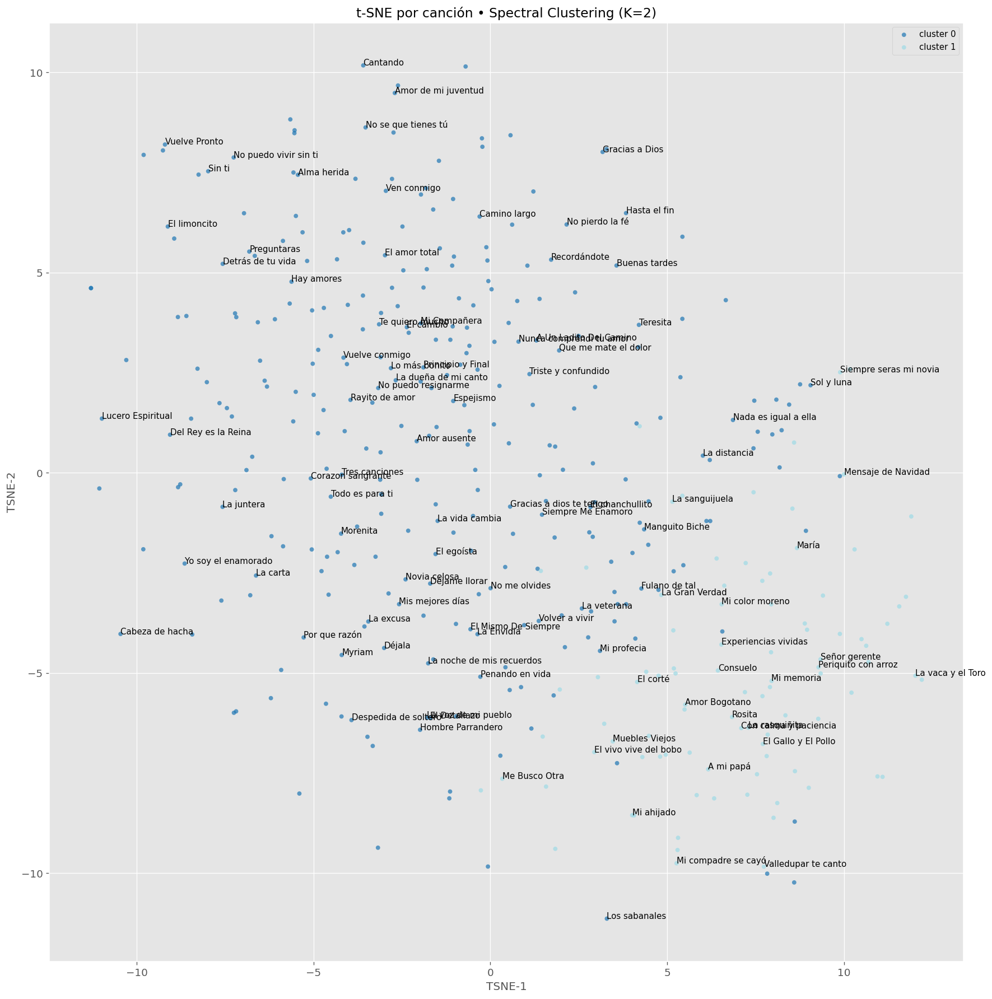

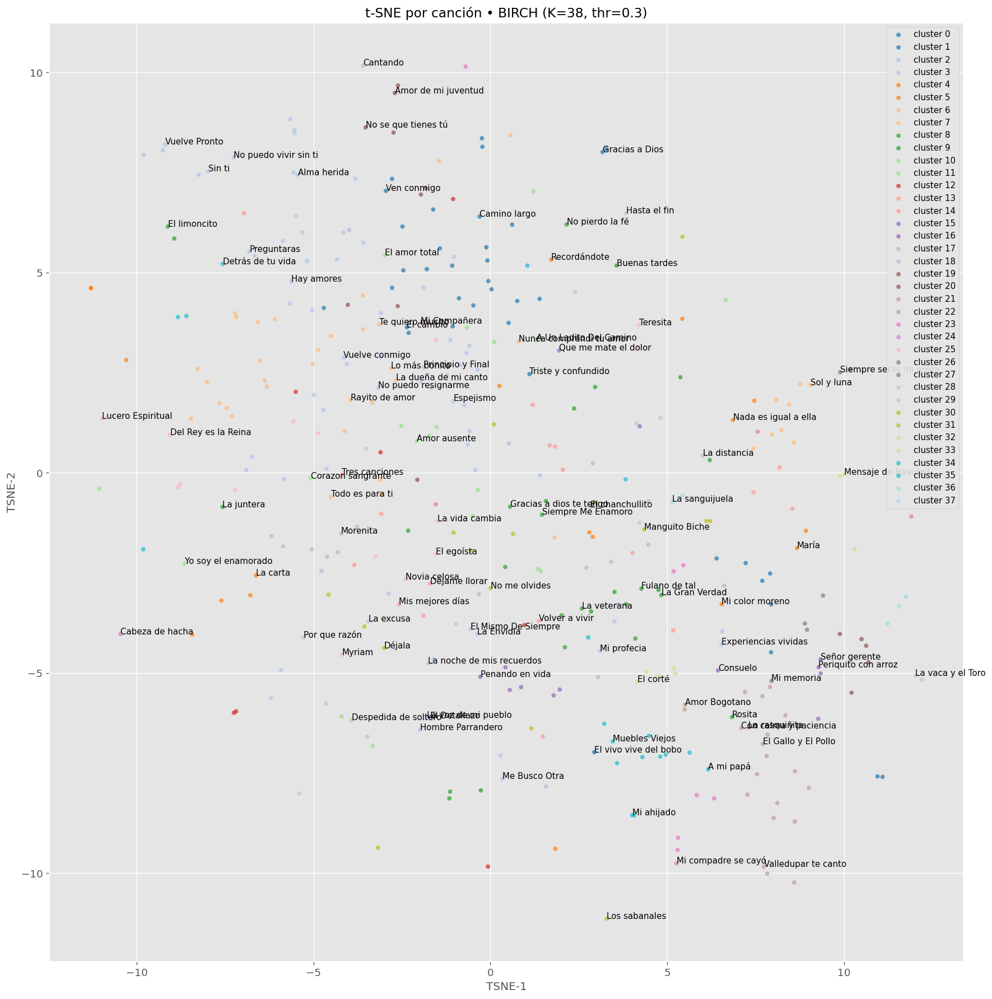

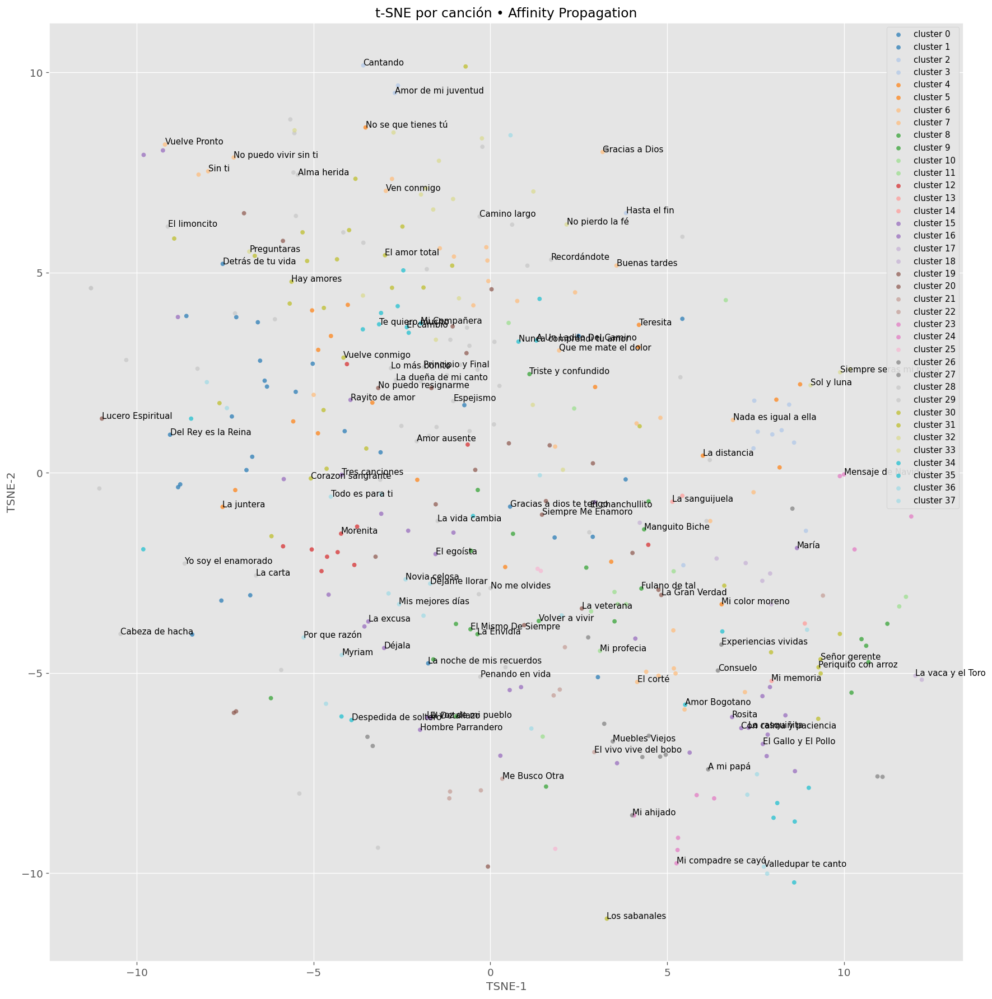

In [ ]:
# Plots
plot_tsne_clusters(T, song_names, labels_spec,
                   title=f"t-SNE por canción • Spectral Clustering (K={best['K']})")
plot_tsne_clusters(T, song_names, labels_birch,
                   title=f"t-SNE por canción • BIRCH (K={K_from_ap}, thr=0.3)")

plot_tsne_clusters(T, song_names, labels_ap,
                   title="t-SNE por canción • Affinity Propagation")

In [ ]:
# =============================
# 4) Mostrar 10 canciones por clúster
# =============================
def top_n_por_cluster(titles, labels, n=10):
    dfc = pd.DataFrame({'nombre_cancion': titles, 'cluster': labels})
    out = {}
    for c, g in dfc.groupby('cluster'):
        out[c] = g['nombre_cancion'].head(n).tolist()   # solo 10
    return out

print("\nEjemplos (10 por clúster) - Spectral Clustering")
ej_gmm = top_n_por_cluster(song_names, labels_spec, n=10)
for c, lista in ej_gmm.items():
    print(f"  Cluster {c} ({len(lista)} muestras): {lista}")

print("\nEjemplos (10 por clúster) - ap")
ej_birch = top_n_por_cluster(song_names, labels_ap, n=10)
for c, lista in ej_birch.items():
    print(f"  Cluster {c} ({len(lista)} muestras): {lista}")

print("\nEjemplos (10 por clúster) - BIRCH")
ej_birch = top_n_por_cluster(song_names, labels_birch, n=10)
for c, lista in ej_birch.items():
    print(f"  Cluster {c} ({len(lista)} muestras): {lista}")


Ejemplos (10 por clúster) - Spectral Clustering
  Cluster 0 (10 muestras): ['A un cariño del alma', 'A Un Ladito Del Camino', 'Acercate a mí', 'Acompáñame', 'Adios lunarcito', 'Aguila', 'Al final del sendero', 'Algo de tu parte', 'Alma enamorada', 'Alma herida']
  Cluster 1 (10 muestras): ['26 de mayo', 'A mi papá', 'A un colega', 'Amor Bogotano', 'Bodas de plata', 'Caracoles de colores', 'Con calma y paciencia', 'Consuelo', 'Cuando me muera', 'Cunde cunde']

Ejemplos (10 por clúster) - ap
  Cluster 0 (10 muestras): ['Algo de tu parte', 'Amorcito consentido', 'Bajo el palo e´mango', 'Detrás de tu vida', 'Dos claveles', 'Dos corazones', 'El Pajuate', 'El palomo', 'Entre el bien y el mal', 'Esos ojos negros']
  Cluster 1 (8 muestras): ['Alma enamorada', 'Con mucho gusto', 'Cristina Isabel', 'Del Rey es la Reina', 'El inventario', 'Gracias a dios te tengo', 'Ni lo intentes', 'Pobre negro']
  Cluster 2 (5 muestras): ['Amor de mi juventud', 'Cantando', 'El besito', 'Hasta el fin', 'María E

## K - means

Se utiliza el Método de Silhouette para estimar un k inicial. Este método grafica la Inercia (suma de distancias cuadradas de cada punto a su centroide: $\sum \min (||x_i - \mu_j||^2)$) contra k, buscando el codo donde la ganancia de añadir más clusters disminuye.

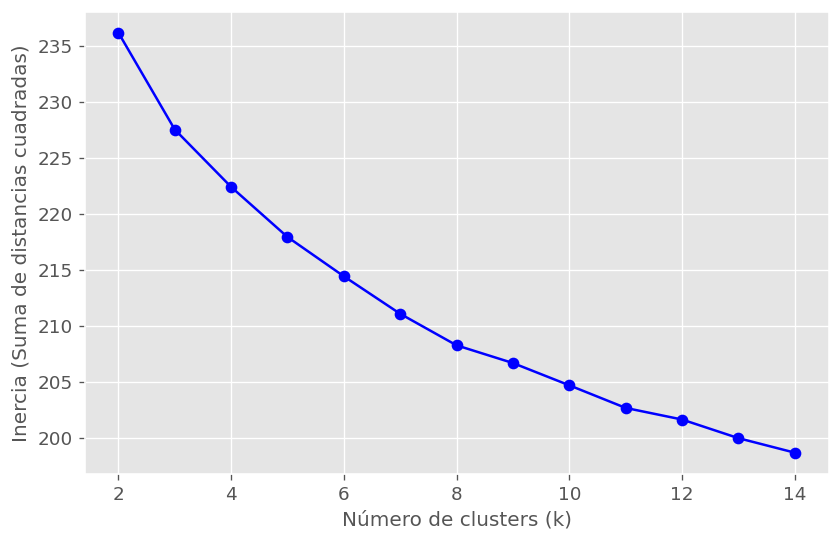

In [ ]:
### Se utiliza el método del codo para identificar cuántos k usar
K = range(2, 15)
inertia = []

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(Xn)
    inertia.append(kmeans.inertia_)  # suma de distancias cuadradas

# Gráfica
plt.figure(figsize=(8,5))
plt.plot(K, inertia, 'bo-')
plt.xlabel('Número de clusters (k)')
plt.ylabel('Inercia (Suma de distancias cuadradas)')
plt.show()

In [ ]:
### K - means
k = 6 # Según el modelo del codo
kmeans = KMeans(n_clusters=k, random_state=42)
labels_kmeans = kmeans.fit_predict(Xn)

# Evaluación de desempeño
sil_km = silhouette_score(Xn, labels_kmeans, metric='cosine')
db_km = davies_bouldin_score(Xn, labels_kmeans)

print(f"[K-Means] clusters: {k}")
print(f"Silhouette: {sil_km:.4f}")
print(f"Davies-Bouldin: {db_km:.4f}")

[K-Means] clusters: 6
Silhouette: 0.0323
Davies-Bouldin: 3.6410


## Clustering jerárquico

Se trata de un enfoque aglomerativo que comienza con cada canción como un cluster y fusiona iterativamente, basado en sus distancias, los dos clusters más cercanos. El dendrograma visualiza este árbol de fusiones.

[Jerárquico] clusters: 6
Silhouette: 0.1261
Davies-Bouldin: 2.2008


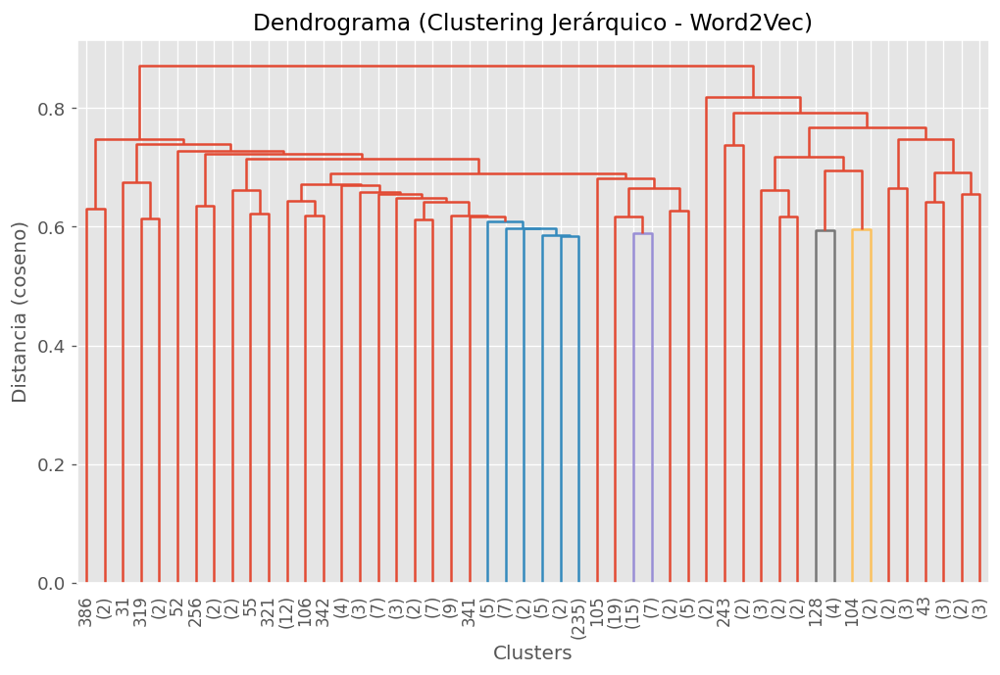

In [ ]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import linkage, dendrogram

### Modelo jerárquico
n_clusters_hc = 6  # mismo número para comparar con K-Means
hc = AgglomerativeClustering(n_clusters=k, metric='cosine', linkage='average')
labels_hc = hc.fit_predict(Xn)

### Evaluación del modelo
sil_hc = silhouette_score(Xn, labels_hc)
db_hc = davies_bouldin_score(Xn, labels_hc)

print(f"[Jerárquico] clusters: {n_clusters_hc}")
print(f"Silhouette: {sil_hc:.4f}")
print(f"Davies-Bouldin: {db_hc:.4f}")

# Dendrograma
Z = linkage(Xn, method='average', metric='cosine')
plt.figure(figsize=(10, 6))
dendrogram(Z, truncate_mode='lastp', p=50, leaf_rotation=90., leaf_font_size=10.)
plt.title("Dendrograma (Clustering Jerárquico - Word2Vec)")
plt.xlabel("Clusters")
plt.ylabel("Distancia (coseno)")
plt.show()

## GMM (Gaussian Mixture Model)

Este es un modelo probabilístico que asume que los datos son una mezcla de $k$ distribuciones Gaussianas. El k óptimo no se predefine, sino que se encuentra iterando sobre un rango de k y seleccionando aquel que minimiza el BIC (Bayesian Information Criterion). El BIC es una métrica de costo que penaliza la complejidad del modelo, previniendo el sobreajuste. Su fórmula es: $BIC = p \cdot \ln(n) - 2 \cdot \ln(\hat{L})$, donde $p$ son los parámetros, $n$ las muestras y $\hat{L}$ la máxima verosimilitud.

[GMM] Buscando K óptimo (Word2Vec)...


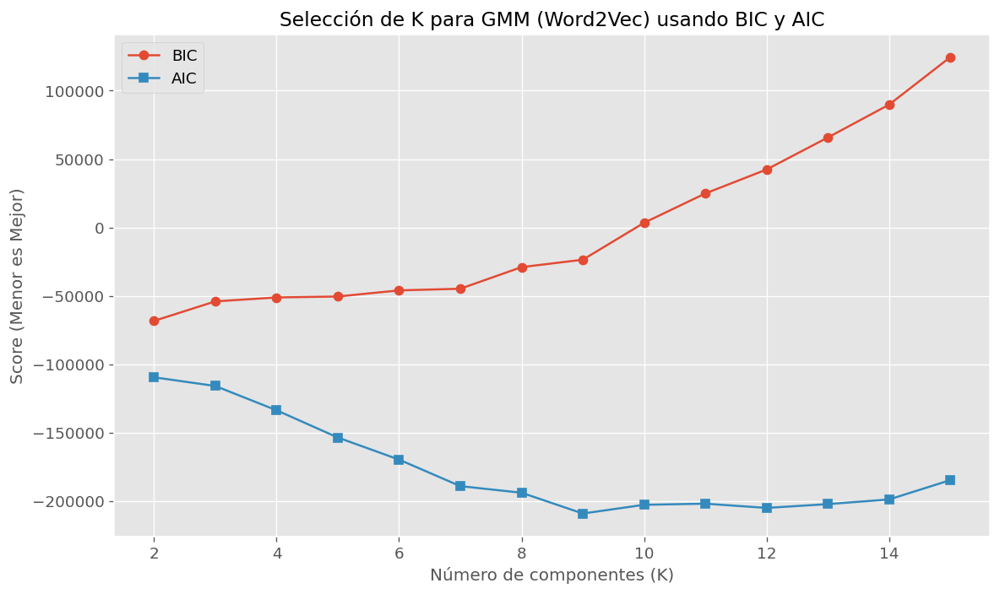

[GMM] K óptimo (vía BIC): 2


In [ ]:
# =========================================================
# 6) GMM (Gaussian Mixture Model) - (Incorporado con BIC/AIC)
# =========================================================

# --- Búsqueda de K óptimo para GMM (Word2Vec) ---
k_range = range(2, 16) # Probar de 2 a 15 clusters
bics = []
aics = []

print("[GMM] Buscando K óptimo (Word2Vec)...")
for k_gmm_test in k_range:
    gmm_test = GaussianMixture(n_components=k_gmm_test, random_state=42, n_init=5)
    gmm_test.fit(Xn) # Xn de Word2Vec
    bics.append(gmm_test.bic(Xn))
    aics.append(gmm_test.aic(Xn))

# --- Gráfica de Criterios ---
plt.figure(figsize=(10, 6))
plt.plot(k_range, bics, marker='o', label='BIC')
plt.plot(k_range, aics, marker='s', label='AIC')
plt.title('Selección de K para GMM (Word2Vec) usando BIC y AIC', fontsize=14)
plt.xlabel('Número de componentes (K)', fontsize=12)
plt.ylabel('Score (Menor es Mejor)', fontsize=12)
plt.legend()
plt.tight_layout()
plt.savefig("w2v_gmm_bic_aic.png")
plt.show()

# --- Seleccionar mejor K (basado en BIC) ---
best_k_gmm = k_range[np.argmin(bics)]
print(f"[GMM] K óptimo (vía BIC): {best_k_gmm}")

/tmp/ipython-input-1192685347.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', n_colors)


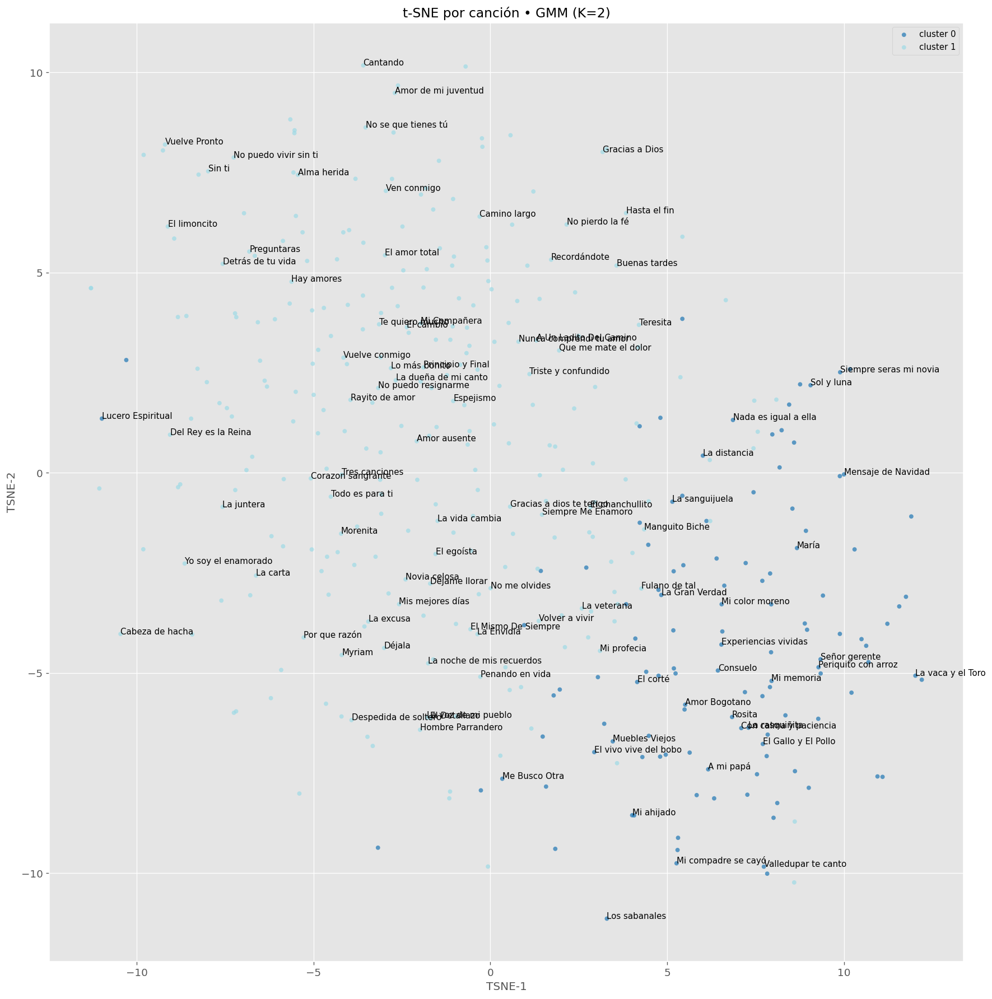

In [ ]:
# --- Entrenar modelo final y graficar ---
gmm = GaussianMixture(n_components=best_k_gmm, random_state=42)
labels_gmm = gmm.fit_predict(Xn)

# Usamos la variable T (X_2d) del t-SNE de Word2Vec
plot_tsne_clusters(T, song_names, labels_gmm,
                   title=f"t-SNE por canción • GMM (K={best_k_gmm})")

In [ ]:
print("\nEjemplos (10 por clúster) - GMM (Word2Vec)")
ej_gmm_w2v = top_n_por_cluster(song_names, labels_gmm, n=10)
for c, lista in ej_gmm_w2v.items():
    print(f"  Cluster {c} ({len(lista)} muestras): {lista}")


Ejemplos (10 por clúster) - GMM (Word2Vec)
  Cluster 0 (10 muestras): ['26 de mayo', 'A mi papá', 'A un colega', 'Amor Bogotano', 'Amores escondidos', 'Bajo el palmar', 'Besar y besar (ft. Tony Gutiérrez)', 'Bodas de plata', 'Canta conmigo', 'Caracoles de colores']
  Cluster 1 (10 muestras): ['A un cariño del alma', 'A Un Ladito Del Camino', 'Acercate a mí', 'Acompáñame', 'Adios lunarcito', 'Aguila', 'Al final del sendero', 'Algo de tu parte', 'Alma enamorada', 'Alma herida']


## BGMM (Bayesian Gaussian Mixture Model)

Es la versión Bayesiana de GMM. Se le da un n_components máximo (ej. 15) y el modelo, usando un proceso de Dirichlet, asigna peso cero a los componentes que no son necesarios, encontrando así el k óptimo automáticamente.

In [ ]:
# =========================================================
# 7) BGMM (Bayesian Gaussian Mixture)
# =========================================================
# BGMM puede encontrar su propio número de clusters.
# Le damos un máximo (ej. 15)
bgmm = BayesianGaussianMixture(n_components=15, random_state=42)
bgmm.fit(Xn)
labels_bgmm = bgmm.predict(Xn)
k_bgmm = len(np.unique(labels_bgmm))

print(f"[BGMM] clusters encontrados: {k_bgmm}")

[BGMM] clusters encontrados: 15


/tmp/ipython-input-1192685347.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', n_colors)


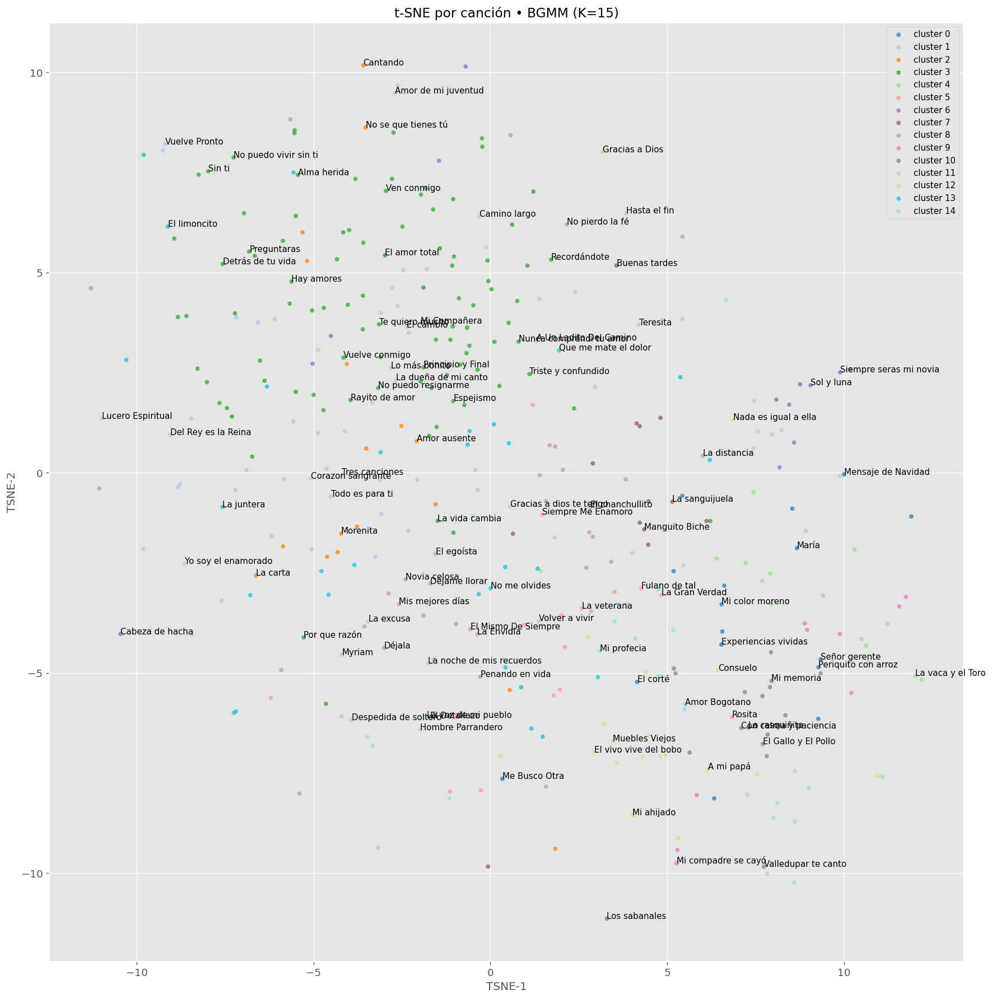

In [ ]:
# Usamos la variable T (X_2d) del t-SNE de Word2Vec
plot_tsne_clusters(T, song_names, labels_bgmm,
                   title=f"t-SNE por canción • BGMM (K={k_bgmm})")

In [ ]:
print("\nEjemplos (10 por clúster) - BGMM (Word2Vec)")
ej_bgmm_w2v = top_n_por_cluster(song_names, labels_bgmm, n=10)
for c, lista in ej_bgmm_w2v.items():
    print(f"  Cluster {c} ({len(lista)} muestras): {lista}")


Ejemplos (10 por clúster) - BGMM (Word2Vec)
  Cluster 0 (10 muestras): ['Cuando me muera', 'El corté', 'El hermano elias', 'El medallón', 'Experiencias vividas', 'La engancha', 'La invitación', 'Los Keloss Del Portero', 'María', 'Me Busco Otra']
  Cluster 1 (10 muestras): ['Acercate a mí', 'Alma enamorada', 'Ayúdame a quererte', 'Bonita', 'Buena mujer', 'Con mucho gusto', 'Consulta De Amor', 'Corazón alegre', 'Corazón callejero', 'Cristina Isabel']
  Cluster 2 (10 muestras): ['Amor ausente', 'Ay la vida', 'Cantando', 'Cuando me voy', 'El alma de un acordeón', 'El romancero', 'La carta', 'Morenita', 'No se que tienes tú', 'Olvidarla siempre es el reto']
  Cluster 3 (10 muestras): ['A un cariño del alma', 'Adios lunarcito', 'Al final del sendero', 'Algo de tu parte', 'Alma herida', 'Amarte más no puedo', 'Amorcito consentido', 'Aquí estan tus canciones', 'Aqui Estoy', 'Así es la vida']
  Cluster 4 (10 muestras): ['Caracoles de colores', 'El comelon', 'El Cordobés', 'El Tigre', 'Hoy me v

## Comparativa entre métricas de modelos (Word2Vec)

A partir de los resultados anteriores de los modelos se genera una tabla comparativa que evalúa todos los modelos bajo tres métricas estándar:

 * **Silhouette Score (↑)**: Mide qué tan bien separados están los clusters. Un valor cercano a 1 es ideal. Se calcula como $s = \frac{b - a}{\max(a, b)}$, donde $a$ es la distancia media intra-cluster y $b$ es la distancia media al cluster vecino más cercano.
 * **Davies-Bouldin (↓)**: Mide el ratio entre la dispersión intra-cluster y la separación inter-cluster. Un valor cercano a 0 es ideal.
 * **Calinski-Harabasz (↑)**: Mide el ratio de la varianza entre-clusters (separación) y la varianza intra-cluster (compactibilidad). Un valor alto es mejor.Se generan gráficos de barras para cada métrica, facilitando la identificación del modelo con mejor desempeño.

In [ ]:
# =========================================================
# 8) Comparativa de Métricas (Word2Vec)
# =========================================================
print("\n--- Comparativa de Métricas (Clustering sobre Word2Vec) ---")

# Recolectar todas las etiquetas
metric_labels = {
    # K de Spectral y Gamma se eligen dinámicamente
    "Spectral": (labels_spec, best['K']),
    "AffinityProp": (labels_ap, n_clusters_ap),
    "BIRCH": (labels_birch, K_from_ap),
    "K-Means": (labels_kmeans, k),
    "Jerárquico": (labels_hc, n_clusters_hc),
    "GMM": (labels_gmm, best_k_gmm),
    "BGMM": (labels_bgmm, k_bgmm)
}

results_w2v = []
for name, (labels, K) in metric_labels.items():
    if K < 2:
        print(f"Omitiendo {name} (K={K}, métricas requieren K >= 2)")
        continue

    sil = silhouette_score(Xn, labels, metric='cosine')
    db = davies_bouldin_score(Xn, labels)
    ch = calinski_harabasz_score(Xn, labels)

    results_w2v.append({
        "Modelo": name,
        "K (clusters)": K,
        "Silhouette (↑)": sil,
        "Davies-Bouldin (↓)": db,
        "Calinski-Harabasz (↑)": ch
    })

df_metrics_w2v = pd.DataFrame(results_w2v).set_index("Modelo").sort_values("Silhouette (↑)", ascending=False)
display(df_metrics_w2v)


--- Comparativa de Métricas (Clustering sobre Word2Vec) ---


,K (clusters),Silhouette (↑),Davies-Bouldin (↓),Calinski-Harabasz (↑)
Modelo,,,,
Spectral,2,0.237221,2.925367,35.284016
Jerárquico,6,0.224031,2.200805,6.412926
GMM,2,0.218129,3.106012,36.876476
BIRCH,38,0.054881,2.522857,5.269790
BGMM,15,0.049016,3.534270,8.132397
K-Means,6,0.032317,3.641022,15.884929
AffinityProp,38,0.027873,2.705705,4.670234


/tmp/ipython-input-4040081203.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


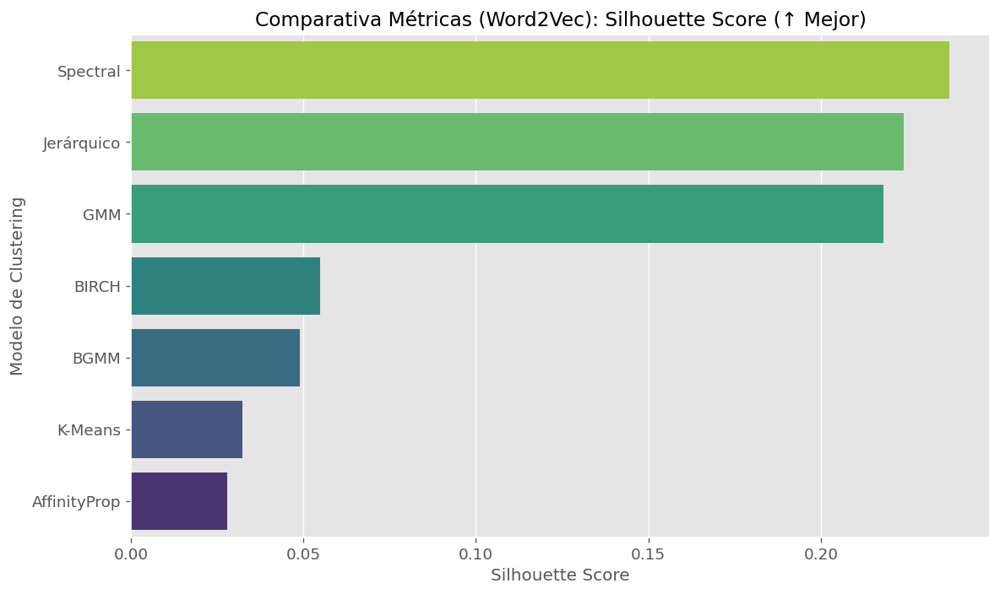

/tmp/ipython-input-4040081203.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


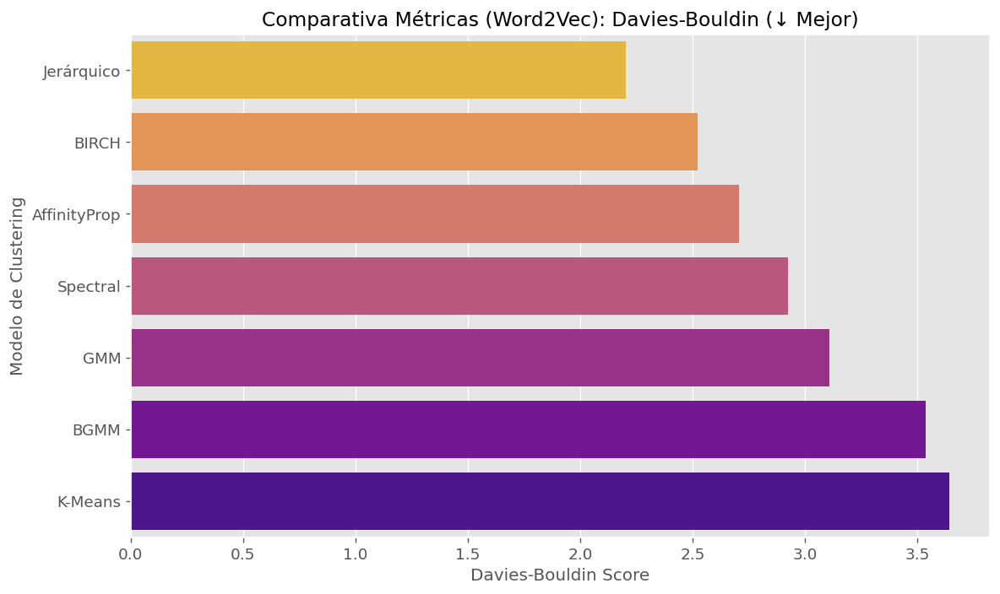

/tmp/ipython-input-4040081203.py:40: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


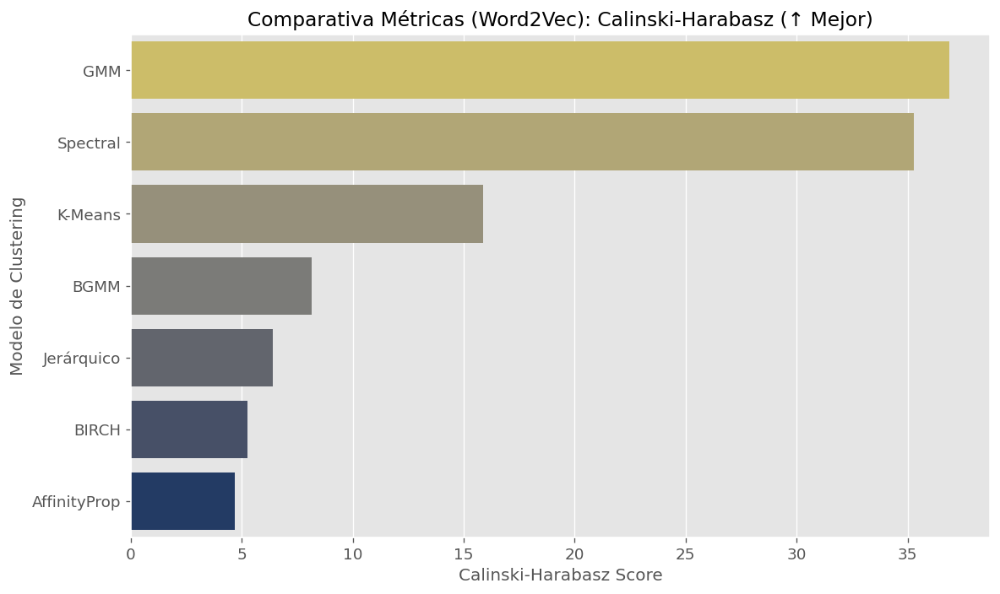

In [ ]:
# --- Gráfico 1: Silhouette Score (Mayor es Mejor) ---
df_plot_sil = df_metrics_w2v.reset_index().sort_values("Silhouette (↑)", ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(
    x="Silhouette (↑)",
    y="Modelo",
    data=df_plot_sil,
    palette="viridis_r" # 'r' invierte el mapa de color
)
plt.title("Comparativa Métricas (Word2Vec): Silhouette Score (↑ Mejor)", fontsize=14)
plt.xlabel("Silhouette Score", fontsize=12)
plt.ylabel("Modelo de Clustering", fontsize=12)
plt.tight_layout()
plt.savefig("w2v_metrics_silhouette.png")
plt.show() # Usamos plt.show() para separar las figuras en la salida


# --- Gráfico 2: Davies-Bouldin Score (Menor es Mejor) ---
df_plot_db = df_metrics_w2v.reset_index().sort_values("Davies-Bouldin (↓)", ascending=True)

plt.figure(figsize=(10, 6))
sns.barplot(
    x="Davies-Bouldin (↓)",
    y="Modelo",
    data=df_plot_db,
    palette="plasma_r"
)
plt.title("Comparativa Métricas (Word2Vec): Davies-Bouldin (↓ Mejor)", fontsize=14)
plt.xlabel("Davies-Bouldin Score", fontsize=12)
plt.ylabel("Modelo de Clustering", fontsize=12)
plt.tight_layout()
plt.savefig("w2v_metrics_davies_bouldin.png")
plt.show()

# --- Gráfico 3: Calinski-Harabasz Score (Mayor es Mejor) ---
df_plot_ch = df_metrics_w2v.reset_index().sort_values("Calinski-Harabasz (↑)", ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(
    x="Calinski-Harabasz (↑)",
    y="Modelo",
    data=df_plot_ch,
    palette="cividis_r"
)
plt.title("Comparativa Métricas (Word2Vec): Calinski-Harabasz (↑ Mejor)", fontsize=14)
plt.xlabel("Calinski-Harabasz Score", fontsize=12)
plt.ylabel("Modelo de Clustering", fontsize=12)
plt.tight_layout()
plt.savefig("w2v_metrics_calinski_harabasz.png")
plt.show()

# Clustering usando la matriz Tf-IDF

Con enfoque agrupa las canciones basándose en su vocabulario compartido y la importancia de sus palabras clave.


## Carga de datos y tokenizacion

Se repite la limpieza de datos para esta sección. Luego, se vectorizan las letras limpias usando TfidfVectorizer.

TF-IDF (Term Frequency-Inverse Document Frequency) asigna un peso a cada palabra en cada canción. El peso es alto si la palabra es frecuente en esa canción (TF) pero rara en todas las demás canciones (IDF). La fórmula es $TF-IDF = TF \times IDF$. El resultado, X_tfidf, es una matriz de alta dimensionalidad (n_canciones x n_palabras_del_vocabulario).

Para que los algoritmos de clustering funcionen, esta matriz se reduce a 100 dimensiones usando TruncatedSVD (Singular Value Decomposition).SVD encuentra 100 componentes que explican la mayor parte de la varianza en los datos, donde el resultado (X_svd) se normaliza (L2) para obtener Xn.

Sobre la matriz Xn resultante de TF-IDF+SVD, se repite el proceso completo de la sección anterior, donde:

 * Se genera una visualización t-SNE.
 * Se entrenan los 7 algoritmos de clustering (Spectral, AP, BIRCH, K-Means, Jerárquico, GMM, BGMM).
 * Se genera una nueva tabla comparativa (df_metrics_tfidf) y sus gráficos de barras asociados.

In [ ]:
!pip -q install rapidfuzz

In [ ]:
import re, unicodedata
from rapidfuzz import fuzz, process

df = pd.read_csv("letras_musica_com_estructuradas_por_lineas.csv", usecols=['nombre_cancion', 'letra_completa'],
                     sep=None, engine='python', encoding='utf-8')

# limpiar nulos y normalizar texto
df = df.dropna(subset=['nombre_cancion', 'letra_completa']).copy()
df['nombre_cancion'] = df['nombre_cancion'].astype(str).str.strip()
df['letra_completa'] = df['letra_completa'].astype(str).str.strip().str.lower()

def normaliza_letra(s: str) -> str:
    if pd.isna(s):
        return ""
    s = str(s).lower()
    # quitar tildes
    s = unicodedata.normalize("NFKD", s)
    s = "".join(ch for ch in s if not unicodedata.combining(ch))
    # quitar puntuación y dejar solo letras/números/espacios
    s = re.sub(r"[^\w\s]", " ", s)
    # colapsar espacios
    s = re.sub(r"\s+", " ", s).strip()
    return s

# 1) Normaliza y dedup EXACTO
df = df.dropna(subset=["letra_completa"]).copy()
df["letra_norm"] = df["letra_completa"].apply(normaliza_letra)
df_exact = df.drop_duplicates(subset=["letra_norm"], keep="first").reset_index(drop=True)


# --- Paso B: agrupar NEAR-DUPLICATES con RapidFuzz ---
#     Umbral: sube a 97 para ser más estricto, baja a 90 para ser más permisivo
THRESH = 85
letras = df["letra_norm"].tolist()
n = len(letras)
# Union-Find para agrupar índices con similitud alta
parent = list(range(n))
def find(a):
    while parent[a] != a:
        parent[a] = parent[parent[a]]
        a = parent[a]
    return a
def union(a, b):
    ra, rb = find(a), find(b)
    if ra != rb:
        parent[rb] = ra

# Para cada letra, buscamos matches dentro del propio conjunto (≥ THRESH)
for i, s in enumerate(letras):
    matches = process.extract(
        s, letras,
        scorer=fuzz.token_set_ratio,   # robusto a reordenamiento y repeticiones
        score_cutoff=THRESH,
        limit=None
    )
    for _, score, j in matches:
        if j == i:
            continue
        union(i, j)

# Construir grupos por raíz
groups = {}
for i in range(n):
    r = find(i)
    groups.setdefault(r, []).append(i)

# Elegir representante por grupo (la letra MÁS LARGA, suele ser la más completa)
df["len_letra"] = df["letra_completa"].str.len()
keep_idx = []
for idxs in groups.values():
    rep = max(idxs, key=lambda k: df.loc[k, "len_letra"])
    keep_idx.append(rep)

keep_mask = np.zeros(n, dtype=bool)
keep_mask[keep_idx] = True

df_sin_dups = (df[keep_mask]
               .drop(columns=["letra_norm", "len_letra"])
               .reset_index(drop=True))

# (Opcional) canciones eliminadas para revisar
dups_removidos = (df[~keep_mask]
                  [["nombre_cancion", "letra_completa"]].copy())

def preview(s, n=120):
    s = (s or "").replace("\n", " ")
    return s[:n] + ("…" if len(s) > n else "")

rows = []
for root, idxs in groups.items():
    # representante (el que mantuviste: letra más larga)
    rep = max(idxs, key=lambda k: df.loc[k, "len_letra"])
    for j in idxs:
        if j == rep:
            continue
        rows.append({
            "grupo_id": int(root),
            "kept_idx": int(rep),
            "kept_nombre": df.loc[rep, "nombre_cancion"],
            "kept_len": int(df.loc[rep, "len_letra"]),
            "drop_idx": int(j),
            "drop_nombre": df.loc[j, "nombre_cancion"],
            "drop_len": int(df.loc[j, "len_letra"]),
            "sim_token_set": fuzz.token_set_ratio(df.loc[rep, "letra_norm"], df.loc[j, "letra_norm"]),
            "kept_preview": preview(df.loc[rep, "letra_completa"]),
            "drop_preview": preview(df.loc[j, "letra_completa"]),
        })

pairs_df = pd.DataFrame(rows).sort_values(["grupo_id", "kept_idx", "drop_idx"]).reset_index(drop=True)
for _, r in pairs_df.iterrows():
    print(f"[Grupo {r.grupo_id}] KEEP: {r.kept_nombre} ({r.kept_len}) "
          f"| DROP: {r.drop_nombre} ({r.drop_len}) "
          f"| sim={r.sim_token_set:.1f}")
    print(f"   KEEP: {r.kept_preview}")
    print(f"   DROP: {r.drop_preview}\n")

df = df_sin_dups



[Grupo 10] KEEP: Algo de tu parte (1638) | DROP: Pon Algo De Tu Parte (1638) | sim=100.0
   KEEP: destino porqué nublas mis ojos destino porqué nublas mis ojos yo no sé como voy a vivir si a la mujer que quiero y adoro…
   DROP: destino porqué nublas mis ojos destino porqué nublas mis ojos yo no sé como voy a vivir si a la mujer que quiero y adoro…

[Grupo 33] KEEP: Bonita (1802) | DROP: Oye bonta (1279) | sim=96.1
   KEEP: oye bonita cuando me estas mirando yo siento que mi vida cubre todo tu cuerpo yo siento que mi vida cubre todo tu cuerpo…
   DROP: oye bonita cuando me estas mirando yo siento que tu vida cubre todo tu cuerpo oye bonita me siento tan contento y en el …

[Grupo 36] KEEP: Buenas tardes (641) | DROP: Perro sinvergüenza (641) | sim=100.0
   KEEP: al ver llegar el sol llego la tarde y me dijo buenas tardes como esta pero sabe no me puedo quedar y así como la tarde l…
   DROP: al ver llegar el sol llego la tarde y me dijo buenas tardes como esta pero sabe no me puedo qued

In [ ]:
# Descargar stopwords en español (solo la primera vez)
nltk.download('stopwords')

# Creamos una lista de stopwords base en español
stop_words = set(stopwords.words('spanish'))

# Opcional: eliminar algunas palabras que sí tienen valor afectivo
palabras_relevantes = {'más', 'menos', 'nunca', 'siempre', 'nadie', 'nada'}
stop_words = stop_words - palabras_relevantes

def limpiar_texto(texto):
    # Si el valor no es string, lo convierte en cadena vacía
    if not isinstance(texto, str):
        return ""
    texto = texto.lower()                                 # minúsculas
    texto = re.sub(f"[{string.punctuation}]", "", texto)  # quitar signos
    texto = re.sub(r"\d+", "", texto)                     # quitar números
    texto = re.sub(r"\s+", " ", texto).strip()            # espacios múltiples
    palabras = [p for p in texto.split() if p not in stop_words]
    return " ".join(palabras)

# Aplicar a la columna
df['frase_limpia'] = df['letra_completa'].apply(limpiar_texto)
song_names = df['nombre_cancion'].tolist()
texts = df['frase_limpia'].tolist()

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


## Creacion de la matriz tf-idf

In [ ]:
# --- 1) TF-IDF por canción ---
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer(
    ngram_range=(1,2),     # unigrams + bigrams (ajústalo)
    min_df=2,              # ignora términos muy raros
    max_df=0.9,            # ignora términos demasiado frecuentes
    strip_accents='unicode',
    sublinear_tf=True,
    norm='l2'
)
X_tfidf = tfidf.fit_transform(texts)   # matriz CSR (n_canciones x vocab)

## Reduccion de dimensionalidad por SVD

In [ ]:
# --- 2) Reducción para t-SNE / clustering ---
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import normalize

n_comp = min(100, X_tfidf.shape[1] - 1) if X_tfidf.shape[1] > 1 else 1
svd = TruncatedSVD(n_components=n_comp, random_state=42)
X_svd = svd.fit_transform(X_tfidf)     # denso (n_canciones x n_comp)
Xn = normalize(X_svd, norm='l2', axis=1)
X = Xn

# --- 3) t-SNE  ---
from sklearn.manifold import TSNE
perplex = min(30, max(5, (len(song_names)-1)//3)) if len(song_names) > 10 else max(2, len(song_names)-1)
tsne = TSNE(n_components=2, perplexity=perplex, early_exaggeration=12.0,
            learning_rate=200.0, init='pca', n_iter=1000, random_state=42)
T = tsne.fit_transform(Xn)  # coords 2D por canción

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


## Visualizacion de datos

In [ ]:
# =============================
# 5) Visualización (cada punto = canción)
# =============================
import numpy as np
import matplotlib.pyplot as plt

plt.style.use('ggplot')  # fondo gris + grid claro
plt.rcParams.update({
    'figure.dpi': 120,        # más nítido
    'font.size': 11,          # tamaño base de fuente
    'axes.titlesize': 14,
    'axes.labelsize': 12,
})

# Para que coincidan con tu snippet:
titles = song_names      # lista de nombres de canción (en el mismo orden que T)

def plot_tsne_songs(T, titles, n_docs=100, seed=7, color='indianred'):
    """
    T: np.ndarray de shape (n, 2) con las coords t-SNE.
    titles: lista de longitud n con los nombres de canciones.
    n_docs: cuántas canciones etiquetar (si chosen es None).
    seed: semilla para muestreo reproducible.
    chosen: lista opcional de canciones específicas a etiquetar.
    """
    titles = np.array(titles)
    n = len(titles)
    n_docs = max(1, min(n_docs, n))
    idx = np.arange(n)
    rng = np.random.default_rng(seed)
    valid_idx = rng.choice(idx, replace=False, size=n_docs)

    plt.figure(figsize=(15, 15))
    plt.scatter(T[:, 0], T[:, 1], s=18, alpha=0.35, c=color, edgecolors='none')
    viz_titles = titles[valid_idx]
    for lbl, x, y in zip(viz_titles, T[valid_idx, 0], T[valid_idx, 1]):
        plt.annotate(lbl, xy=(x, y), xytext=(0, 0), textcoords='offset points', fontsize=8)

    plt.grid(True, alpha=0.2)
    plt.xlabel("TSNE-1"); plt.ylabel("TSNE-2")
    plt.title("t-SNE de canciones (Word2Vec → promedio por canción)")
    plt.tight_layout()
    plt.show()

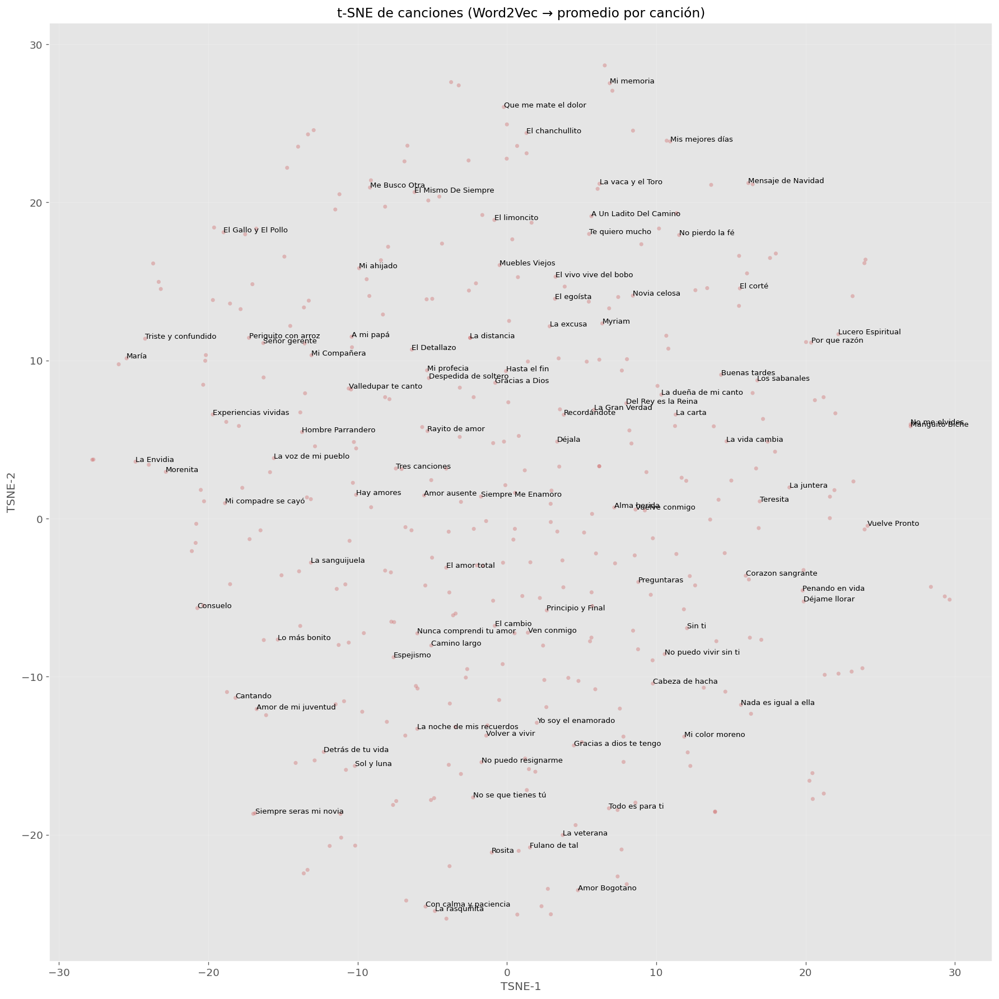

In [ ]:
# --- Ejemplos de uso ---
plot_tsne_songs(T, titles, n_docs=100, seed=7)

## Spectral Clustering

In [ ]:
# =============================
# 1) Spectral Clustering
#    Eleccion de K por silueta
# =============================

from sklearn.preprocessing import normalize
from sklearn.cluster import SpectralClustering
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import silhouette_score

best = {"score": -1, "K": None, "gamma": None, "labels": None}
for gamma in [0.1, 0.5, 1.0, 2.0]:
    for K in range(2, 100):
        sc = SpectralClustering(n_clusters=K, affinity='rbf', gamma=gamma,
                                assign_labels='kmeans', random_state=42)
        labels = sc.fit_predict(Xn)
        s = silhouette_score(Xn, labels, metric='cosine')
        if s > best["score"]:
            best.update({"score": s, "K": K, "gamma": gamma, "labels": labels})

print(f"Mejor combinación (RBF): K={best['K']}, gamma={best['gamma']} (silhouette={best['score']:.3f})")
labels_spec = best["labels"]

Mejor combinación (RBF): K=97, gamma=2.0 (silhouette=0.083)


## Affinity propagation

In [ ]:
# =========================================================
# 2) Clustering con Affinity Propagation
# =========================================================
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import DBSCAN, AffinityPropagation
# AP necesita una matriz de similitud: usamos coseno

S = cosine_similarity(Xn)                      # similitud en [-1, 1]
pref = np.median(S)                            # controla #clusters
ap = AffinityPropagation(affinity='precomputed', damping=0.9,
                         preference=pref, random_state=42)
labels_ap = ap.fit_predict(S)

n_clusters_ap = len(np.unique(labels_ap))
print(f"[AffinityPropagation] clusters: {n_clusters_ap}")

[AffinityPropagation] clusters: 72


## BIRCH

In [ ]:
# =============================
# 3) BIRCH
#    Usamos K por silueta
# =============================
from sklearn.cluster import Birch, KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

def birch_k_by_silhouette(
    Xn,
    thresholds=(0.2, 0.25, 0.3, 0.35, 0.4, 0.5, 0.6, 0.8),
    Ks=None,
    branching_factor=50,
):
    """
    Busca (threshold, K) que maximiza silhouette en BIRCH.
    - Xn: matriz (n x d), ya normalizada (p.ej., TF-IDF -> SVD -> normalize)
    - thresholds: rejilla de thresholds a probar
    - Ks: rango/lista de K a probar; si None -> 2..min(60, n-1)
    """
    n = Xn.shape[0]
    if Ks is None:
        Ks = range(2, min(60, n))  # BIRCH no puede tener K >= n

    best = {"score": -1, "K": None, "thr": None, "labels": None, "model": None}

    for thr in thresholds:
        # Paso 1: CF tree para saber cuántos subclusters produce ese threshold
        bir_cf = Birch(threshold=thr, branching_factor=branching_factor, n_clusters=None)
        bir_cf.fit(Xn)
        m = bir_cf.subcluster_centers_.shape[0]

        for K in Ks:
            if K >= n or K < 2:
                continue
            if m < K:
                # con este threshold no hay suficientes subclusters para particionar en K
                continue

            # Paso 2: clustering final con ese K
            model = Birch(threshold=thr, branching_factor=branching_factor, n_clusters=K)
            labels = model.fit_predict(Xn)

            # silhouette necesita >=2 clusters efectivos
            if len(np.unique(labels)) < 2:
                continue

            s = silhouette_score(Xn, labels, metric='cosine')
            if s > best["score"]:
                best.update({"score": s, "K": K, "thr": thr, "labels": labels, "model": model})

    if best["labels"] is None:
        raise RuntimeError("Ninguna combinación produjo ≥2 clústeres. Prueba thresholds más bajos o amplía el rango de K.")

    print(f"[BIRCH] K*={best['K']}  threshold*={best['thr']}  silhouette={best['score']:.3f}")
    return best["labels"], best["model"], best["K"], best["thr"]

# --- Uso ---
labels_birch, birch_best, k_birch, thr_birch = birch_k_by_silhouette(
    Xn,
    thresholds=(0.2, 0.25, 0.3, 0.35, 0.4, 0.5, 0.6),
    Ks=range(2, 60)  # ajusta el tope según tu dataset
)

[BIRCH] K*=59  threshold*=0.35  silhouette=0.074


/tmp/ipython-input-1192685347.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', n_colors)


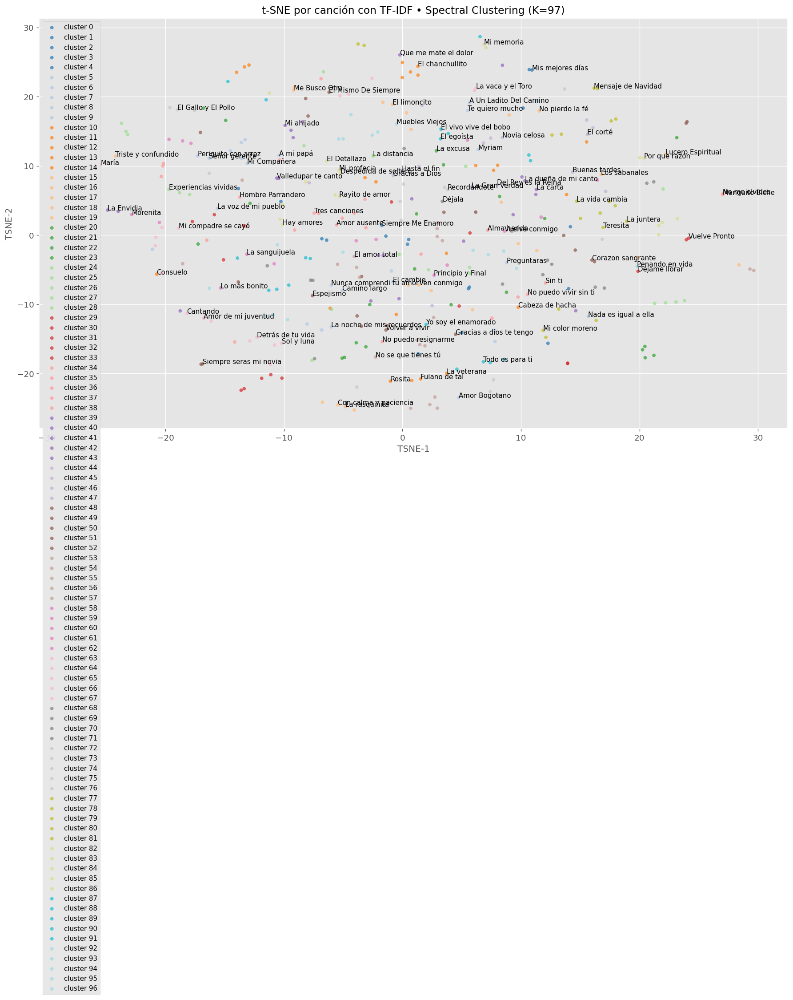

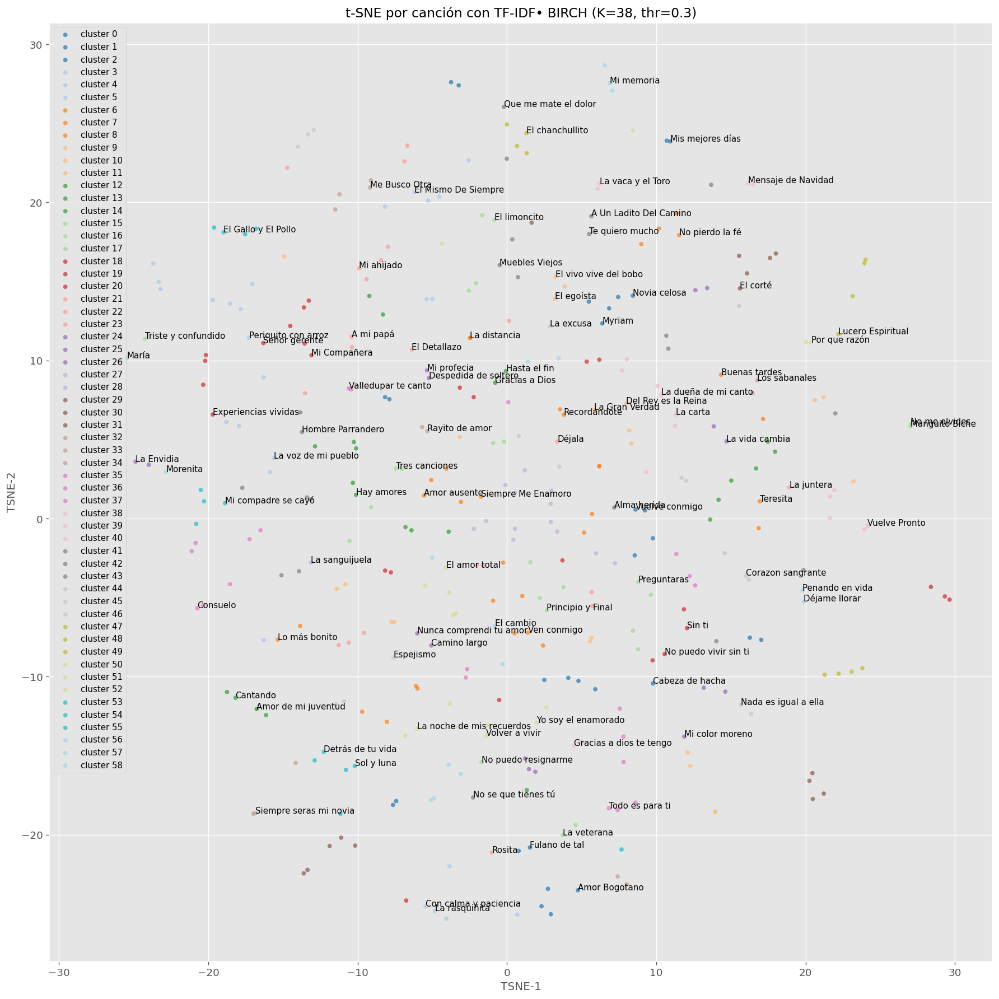

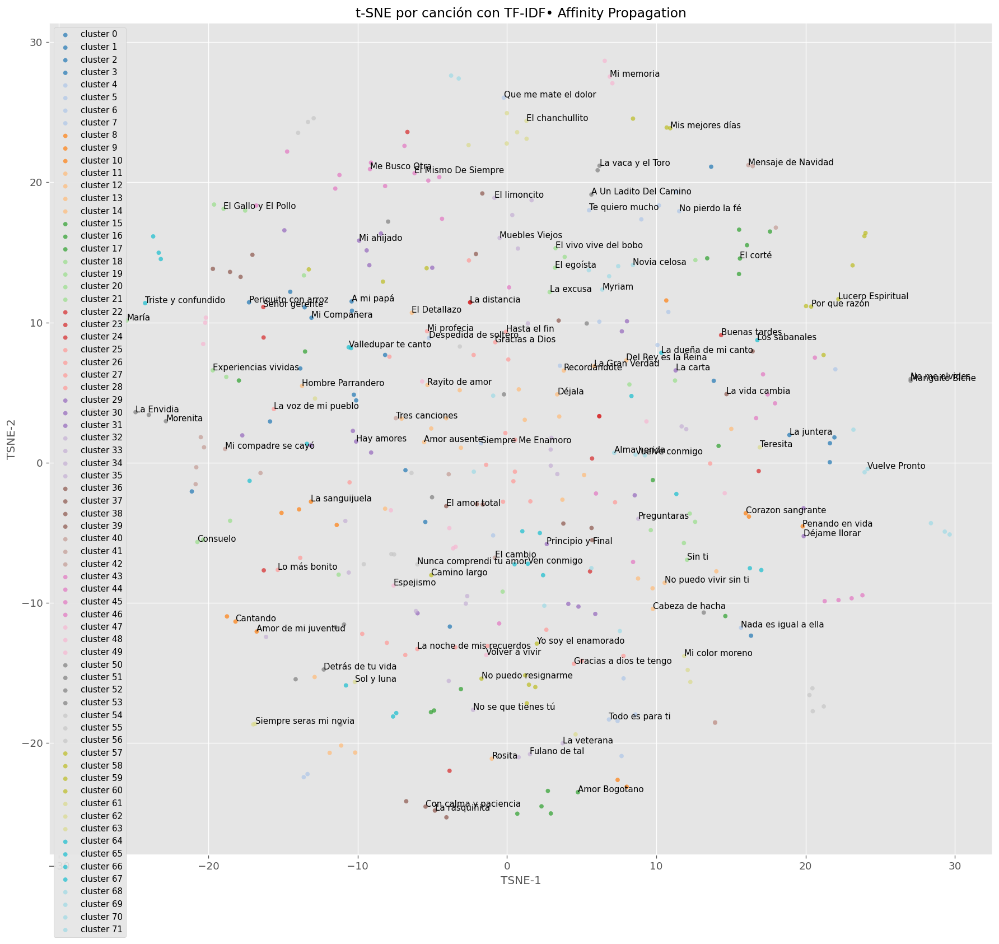

In [ ]:
# Plots
plot_tsne_clusters(T, song_names, labels_spec,
                   title=f"t-SNE por canción con TF-IDF • Spectral Clustering (K={best['K']})")
plot_tsne_clusters(T, song_names, labels_birch,
                   title=f"t-SNE por canción con TF-IDF• BIRCH (K={K_from_ap}, thr=0.3)")

plot_tsne_clusters(T, song_names, labels_ap,
                   title="t-SNE por canción con TF-IDF• Affinity Propagation")

In [ ]:
print("\nEjemplos (10 por clúster) con TF-IDF - Spectral Clustering")
ej_gmm = top_n_por_cluster(song_names, labels_spec, n=10)
for c, lista in ej_gmm.items():
    print(f"  Cluster {c} ({len(lista)} muestras): {lista}")

print("\nEjemplos (10 por clúster) con TF-IDF- ap")
ej_birch = top_n_por_cluster(song_names, labels_ap, n=10)
for c, lista in ej_birch.items():
    print(f"  Cluster {c} ({len(lista)} muestras): {lista}")

print("\nEjemplos (10 por clúster) con TF-IDF - BIRCH")
ej_birch = top_n_por_cluster(song_names, labels_birch, n=10)
for c, lista in ej_birch.items():
    print(f"  Cluster {c} ({len(lista)} muestras): {lista}")


Ejemplos (10 por clúster) con TF-IDF - Spectral Clustering
  Cluster 0 (2 muestras): ['Mis mejores días', 'Placer y pena']
  Cluster 1 (5 muestras): ['Amigos mios', 'El tropezon', 'Humilde Viajero', 'Mi futuro', 'Por Dos Mil Siglos']
  Cluster 2 (3 muestras): ['Aquí estan tus canciones', 'Caray', 'Simulación']
  Cluster 3 (6 muestras): ['Buscando un Nido', 'Creo en el destino', 'Fantasía', 'Gaviota herida', 'No tengo la culpa', 'Siempre Me Enamoro']
  Cluster 4 (2 muestras): ['Mis amores', 'Se te nota en la mirada']
  Cluster 5 (5 muestras): ['Amor Bogotano', 'Del Rey es la Reina', 'Dos claveles', 'Nada es igual a ella', 'Tú y la gente']
  Cluster 6 (8 muestras): ['A mi papá', 'A un colega', 'Condor herido', 'Gracias señor', 'Mi muchacho', 'Mi vida musical', 'Regreso del condór', 'Señor gerente']
  Cluster 7 (5 muestras): ['A Un Ladito Del Camino', 'Mi Compañera', 'Myriam', 'Preguntaras', 'Te quiero mucho']
  Cluster 8 (4 muestras): ['El sentir de mi pueblo', 'La noche de mis recuerdo

## Nube de palabras

Para este paso se generan nubes de palabras (WordCloud). La función plot_wordclouds_by_cluster calcula el score TF-IDF promedio de cada palabra dentro de un cluster. Las palabras con los scores promedio más altos (las más distintivas) se dibujan más grandes, proporcionando una herramienta visual poderosa para interpretar el tema de cada cluster.

In [ ]:
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

# --- 1) TF-IDF global sobre TODAS las canciones (para comparar bien entre clústeres) ---
stop_es = stopwords.words('spanish')
tfidf = TfidfVectorizer(
    stop_words=stop_es,
    strip_accents='unicode',
    ngram_range=(1,2),   # unigrams+bigramas; cámbialo si quieres
    min_df=2, max_df=0.9,
    sublinear_tf=True, norm='l2'
)
texts = df['letra_completa'].astype(str).tolist()
X_tfidf = tfidf.fit_transform(texts)
feat = np.array(tfidf.get_feature_names_out())

# --- 2) Helper: TF-IDF promedio del clúster -> dict de frecuencias ---
def cluster_freqs(X, labels, cid, topn=200):
    idx = np.where(labels == cid)[0]
    if len(idx) == 0:
        return {}
    avg = np.asarray(X[idx].mean(axis=0)).ravel()
    top = avg.argsort()[::-1][:topn]
    return {feat[i]: float(avg[i]) for i in top if avg[i] > 0}

# --- 3) Plot de nubes (elige qué clusters mostrar) ---
def plot_wordclouds_by_cluster(X, labels, clusters=None, title_prefix="Cluster", topn=200):
    labels = np.asarray(labels)
    uniq = sorted(np.unique(labels))
    if clusters is None:
        clusters = uniq
    clusters = [c for c in clusters if c in uniq]

    n = len(clusters)
    ncols = min(3, n)
    nrows = int(np.ceil(n / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(8*ncols, 6*nrows))
    if n == 1:
        axes = np.array([axes])
    axes = axes.ravel()

    for ax, cid in zip(axes, clusters):
        freqs = cluster_freqs(X, labels, cid, topn=topn)
        if not freqs:
            ax.axis('off'); ax.set_title(f"{title_prefix} {cid} (vacío)")
            continue
        wc = WordCloud(width=1000, height=600, background_color='black', colormap='Set2')
        wc = wc.generate_from_frequencies(freqs)
        ax.imshow(wc, interpolation='bilinear'); ax.axis('off')
        ax.set_title(f"{title_prefix} {cid}")
    # apaga axes sobrantes
    for ax in axes[len(clusters):]:
        ax.axis('off')
    plt.tight_layout(); plt.show()


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
/usr/local/lib/python3.12/dist-packages/sklearn/feature_extraction/text.py:402: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['eramos', 'estabamos', 'estais', 'estan', 'estara', 'estaran', 'estaras', 'estare', 'estareis', 'estaria', 'estariais', 'estariamos', 'estarian', 'estarias', 'esteis', 'esten', 'estes', 'estuvieramos', 'estuviesemos', 'fueramos', 'fuesemos', 'habeis', 'habia', 'habiais', 'habiamos', 'habian', 'habias', 'habra', 'habran', 'habras', 'habre', 'habreis', 'habria', 'habriais', 'habriamos', 'habrian', 'habrias', 'hayais', 'hubieramos', 'hubiesemos', 'mas', 'mia', 'mias', 'mio', 'mios', 'seais', 'sera', 'seran', 'seras', 'sere', 'sereis', 'seria', 'seriais', 'seriamos', 'serian', 'serias', 'si', 'tambien', 'tendra', 'tendran', 'tendras', 'tendre', 'tendreis', 'tendria', 'tendriais'

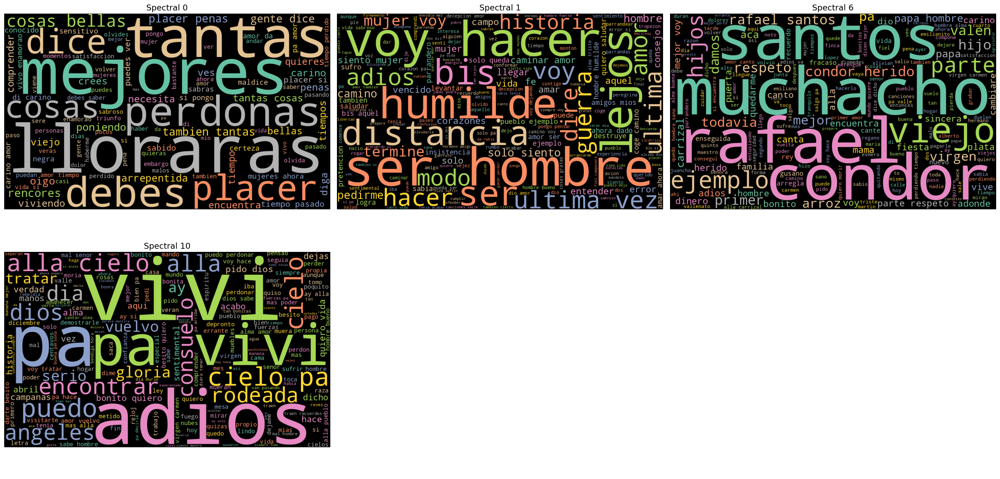

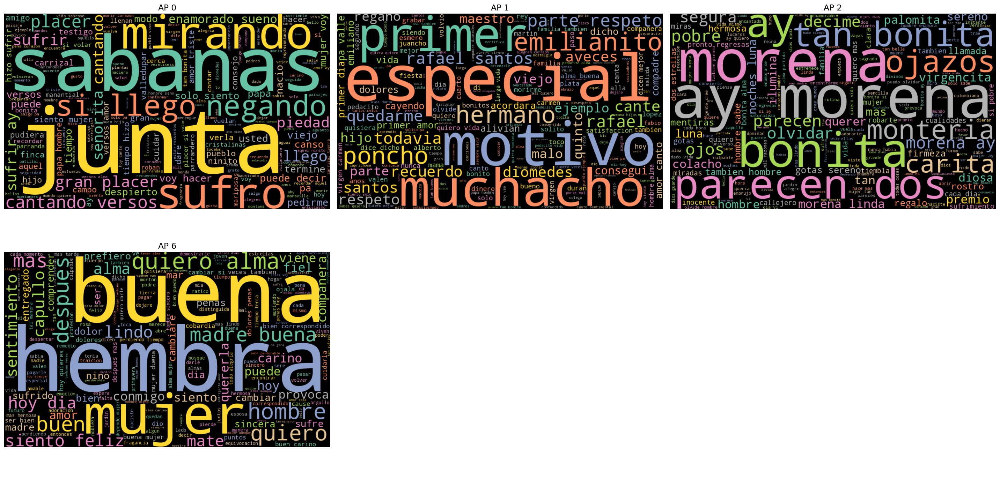

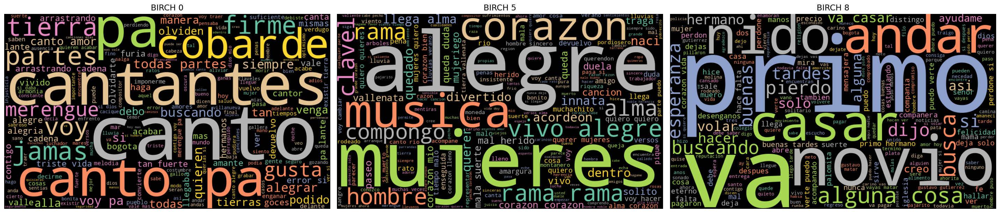

In [ ]:
# ================== USO ==================
# labels_spec  = etiquetas de Spectral
# labels_ap    = etiquetas de Affinity Propagation
# labels_birch = etiquetas de BIRCH

# Ejemplos: mostrar solo algunos clústeres
plot_wordclouds_by_cluster(X_tfidf, labels_spec,  clusters=[0,1,6,10], title_prefix="Spectral")
plot_wordclouds_by_cluster(X_tfidf, labels_ap,    clusters=[0,1,2,6], title_prefix="AP")
plot_wordclouds_by_cluster(X_tfidf, labels_birch, clusters=[0,5,8],    title_prefix="BIRCH")

## K - means

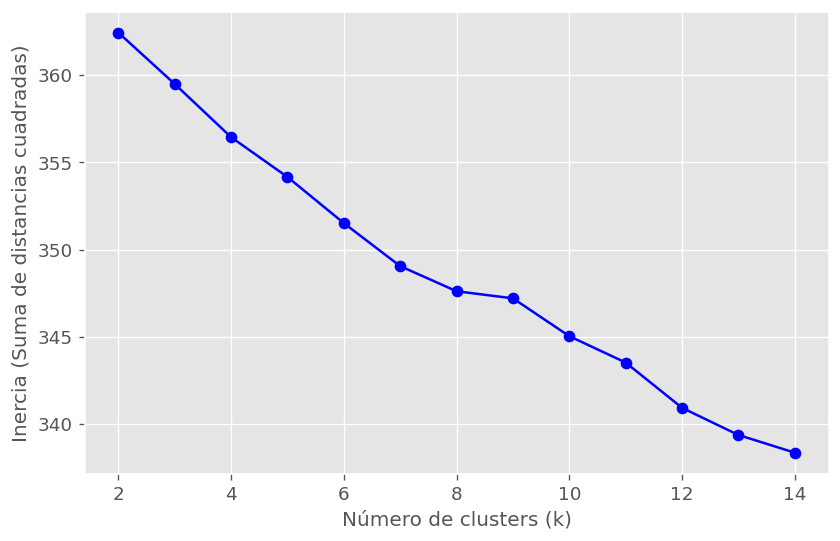

In [ ]:
inertias = []
K = range(2, 15)

for k in K:
    km = KMeans(n_clusters=k, random_state=42)
    km.fit(Xn)
    inertias.append(km.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(K, inertias, 'bo-')
plt.xlabel('Número de clusters (k)')
plt.ylabel('Inercia (Suma de distancias cuadradas)')
plt.show()

In [ ]:
k = 6
km = KMeans(n_clusters=k, random_state=42)
labels_kmeans = km.fit_predict(Xn)

df["cluster_tfidf_kmeans"] = labels_kmeans
# Evaluación de desempeño
sil_km = silhouette_score(Xn, labels_kmeans, metric='cosine')
db_km = davies_bouldin_score(Xn, labels_kmeans)

print(f"[K-Means] clusters: {k}")
print(f"Silhouette: {sil_km:.4f}")
print(f"Davies-Bouldin: {db_km:.4f}")

[K-Means] clusters: 6
Silhouette: 0.0195
Davies-Bouldin: 6.5917


## Clustering jerárquico

[Jerárquico] clusters: 6
Silhouette: 0.0019
Davies-Bouldin: 3.3563


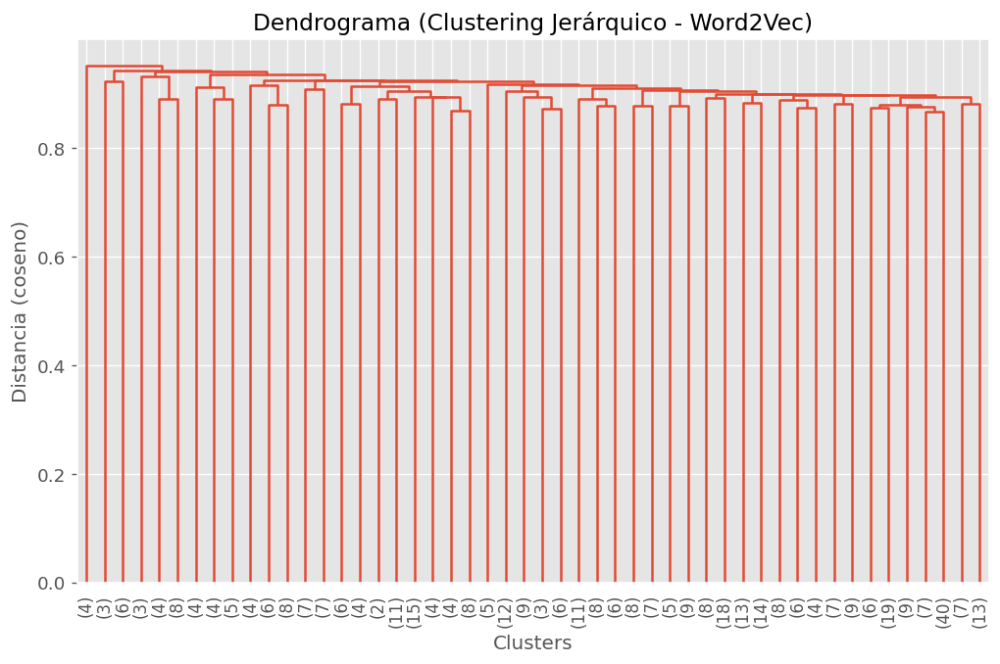

In [ ]:
### Modelo jerárquico
n_clusters_hc = 6  # mismo número para comparar con K-Means
hc = AgglomerativeClustering(n_clusters=k, metric='cosine', linkage='average')
labels_hc = hc.fit_predict(Xn)

### Evaluación del modelo
sil_hc = silhouette_score(Xn, labels_hc)
db_hc = davies_bouldin_score(Xn, labels_hc)

print(f"[Jerárquico] clusters: {n_clusters_hc}")
print(f"Silhouette: {sil_hc:.4f}")
print(f"Davies-Bouldin: {db_hc:.4f}")

# Dendrograma
Z = linkage(Xn, method='average', metric='cosine')
plt.figure(figsize=(10, 6))
dendrogram(Z, truncate_mode='lastp', p=50, leaf_rotation=90., leaf_font_size=10.)
plt.title("Dendrograma (Clustering Jerárquico - Word2Vec)")
plt.xlabel("Clusters")
plt.ylabel("Distancia (coseno)")
plt.show()

## GMM (Gaussian Mixture Model)

[GMM] Buscando K óptimo (TF-IDF)...


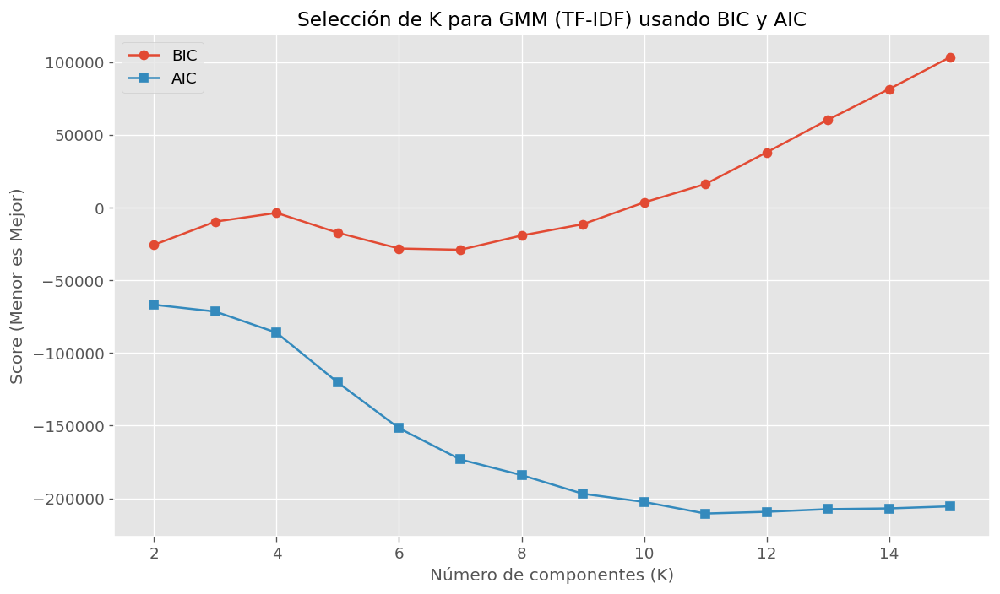

[GMM con TF-IDF] K óptimo (vía BIC): 7


In [ ]:
# =========================================================
# 6) GMM (Gaussian Mixture Model) - (Incorporado con BIC/AIC)
# =========================================================

# --- Búsqueda de K óptimo para GMM (TF-IDF) ---
k_range_tfidf = range(2, 16) # Probar de 2 a 15 clusters
bics_tfidf = []
aics_tfidf = []

print("[GMM] Buscando K óptimo (TF-IDF)...")
for k_gmm_test in k_range_tfidf:
    gmm_test = GaussianMixture(n_components=k_gmm_test, random_state=42, n_init=5)
    gmm_test.fit(Xn) # Xn de TF-IDF
    bics_tfidf.append(gmm_test.bic(Xn))
    aics_tfidf.append(gmm_test.aic(Xn))

# --- Gráfica de Criterios ---
plt.figure(figsize=(10, 6))
plt.plot(k_range_tfidf, bics_tfidf, marker='o', label='BIC')
plt.plot(k_range_tfidf, aics_tfidf, marker='s', label='AIC')
plt.title('Selección de K para GMM (TF-IDF) usando BIC y AIC', fontsize=14)
plt.xlabel('Número de componentes (K)', fontsize=12)
plt.ylabel('Score (Menor es Mejor)', fontsize=12)
plt.legend()
plt.tight_layout()
plt.savefig("tfidf_gmm_bic_aic.png")
plt.show()

# --- Seleccionar mejor K (basado en BIC) ---
best_k_gmm_tfidf = k_range_tfidf[np.argmin(bics_tfidf)]
print(f"[GMM con TF-IDF] K óptimo (vía BIC): {best_k_gmm_tfidf}")

# --- Entrenar modelo final y graficar ---
gmm_tfidf = GaussianMixture(n_components=best_k_gmm_tfidf, random_state=42)
labels_gmm_tfidf = gmm_tfidf.fit_predict(Xn) # Xn de TF-IDF

/tmp/ipython-input-1192685347.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', n_colors)


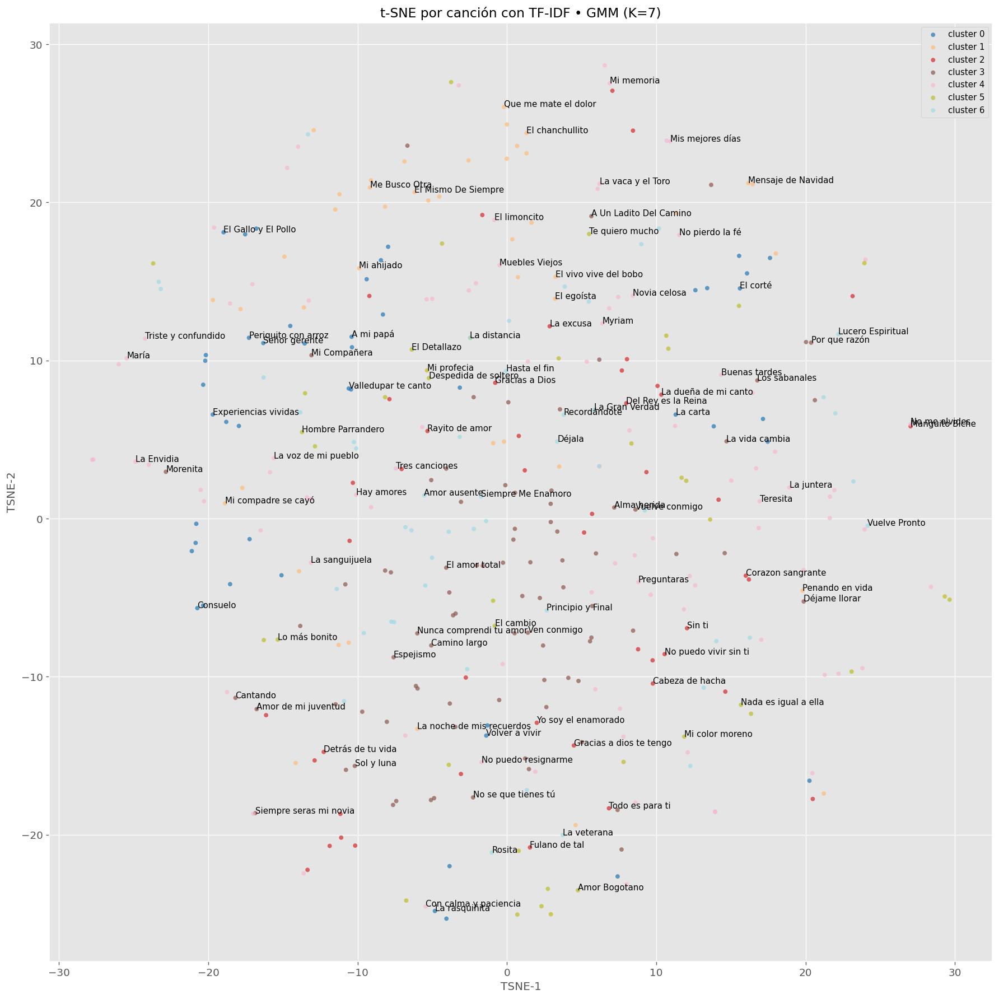

In [ ]:
# Usamos la variable T del t-SNE de TF-IDF
plot_tsne_clusters(T, song_names, labels_gmm_tfidf,
                   title=f"t-SNE por canción con TF-IDF • GMM (K={best_k_gmm_tfidf})")

In [ ]:
print("\nEjemplos (10 por clúster) - GMM (TF-IDF)")
# (Usa las variables 'song_names' y 'labels_gmm_tfidf' de la sección TF-IDF)
ej_gmm_tfidf_list = top_n_por_cluster(song_names, labels_gmm_tfidf, n=10)
for c, lista in ej_gmm_tfidf_list.items():
    print(f"  Cluster {c} ({len(lista)} muestras): {lista}")


Ejemplos (10 por clúster) - GMM (TF-IDF)
  Cluster 0 (10 muestras): ['26 de mayo', 'A mi papá', 'A un colega', 'Canta conmigo', 'Caracoles de colores', 'Consuelo', 'Cuando me muera', 'Cunde cunde', 'De mi propia raza', 'El comelon']
  Cluster 1 (10 muestras): ['Acompáñame', 'Amorcito consentido', 'Así me hizo Dios', 'Bodas de plata', 'Camina', 'Con la misma vaina', 'El chanchullito', 'El desquite', 'El egoísta', 'El Escorpion']
  Cluster 2 (10 muestras): ['Ayúdame a quererte', 'Cabeza de hacha', 'Cardon guajiro', 'Cariñito de mi vida', 'Con mucho gusto', 'Corazon sangrante', 'Cuando falte yo', 'Cuando no estás tú', 'Deja la Duda', 'Del Rey es la Reina']
  Cluster 3 (10 muestras): ['A un cariño del alma', 'A Un Ladito Del Camino', 'Adios lunarcito', 'Aguila', 'Al final del sendero', 'Algo de tu parte', 'Alma herida', 'Amarte más no puedo', 'Amor de mi juventud', 'Aquí estan tus canciones']
  Cluster 4 (10 muestras): ['Acercate a mí', 'Alma enamorada', 'Aqui esta lo tuyo', 'Ay la vida',

## BGMM (Byesian Gaussian Mixture Model)

In [ ]:
# =========================================================
# 7) BGMM (Bayesian Gaussian Mixture)
# =========================================================
bgmm_tfidf = BayesianGaussianMixture(n_components=15, random_state=42)
bgmm_tfidf.fit(Xn) # Xn de TF-IDF
labels_bgmm_tfidf = bgmm_tfidf.predict(Xn)
k_bgmm_tfidf = len(np.unique(labels_bgmm_tfidf))

print(f"[BGMM con TF-IDF] clusters encontrados: {k_bgmm_tfidf}")

[BGMM con TF-IDF] clusters encontrados: 15


In [ ]:
print("\nEjemplos (10 por clúster) - BGMM (TF-IDF)")
# (Usa las variables 'song_names' y 'labels_bgmm_tfidf' de la sección TF-IDF)
ej_bgmm_tfidf_list = top_n_por_cluster(song_names, labels_bgmm_tfidf, n=10)
for c, lista in ej_bgmm_tfidf_list.items():
    print(f"  Cluster {c} ({len(lista)} muestras): {lista}")


Ejemplos (10 por clúster) - BGMM (TF-IDF)
  Cluster 0 (10 muestras): ['A mi papá', 'Buscando un Nido', 'Cuando me muera', 'El Gallo y El Pollo', 'El hermano elias', 'El Perdón', 'El salao', 'Eres mi vida', 'Experiencias vividas', 'Gracias por quererla']
  Cluster 1 (10 muestras): ['Ayúdame a quererte', 'Condor herido', 'Cuando falte yo', 'Cuando no estás tú', 'Deja la Duda', 'Del Rey es la Reina', 'Dos claveles', 'El besito', 'El quedao', 'Gracias a dios te tengo']
  Cluster 2 (10 muestras): ['A Un Ladito Del Camino', 'Alma herida', 'Aqui Estoy', 'Camino largo', 'Consulta De Amor', 'Déjame llorar', 'Delirio', 'El cambio', 'Felicidad perdida', 'Frente a mi']
  Cluster 3 (10 muestras): ['Adios lunarcito', 'Así me hizo Dios', 'Ay la vida', 'Besar y besar (ft. Tony Gutiérrez)', 'Con calma y paciencia', 'Con mucho gusto', 'Cristina Isabel', 'El Bachiller', 'El Mismo De Siempre', 'El romancero']
  Cluster 4 (10 muestras): ['Amorcito consentido', 'El limoncito', 'El parquecito', 'Honda herid

/tmp/ipython-input-1192685347.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', n_colors)


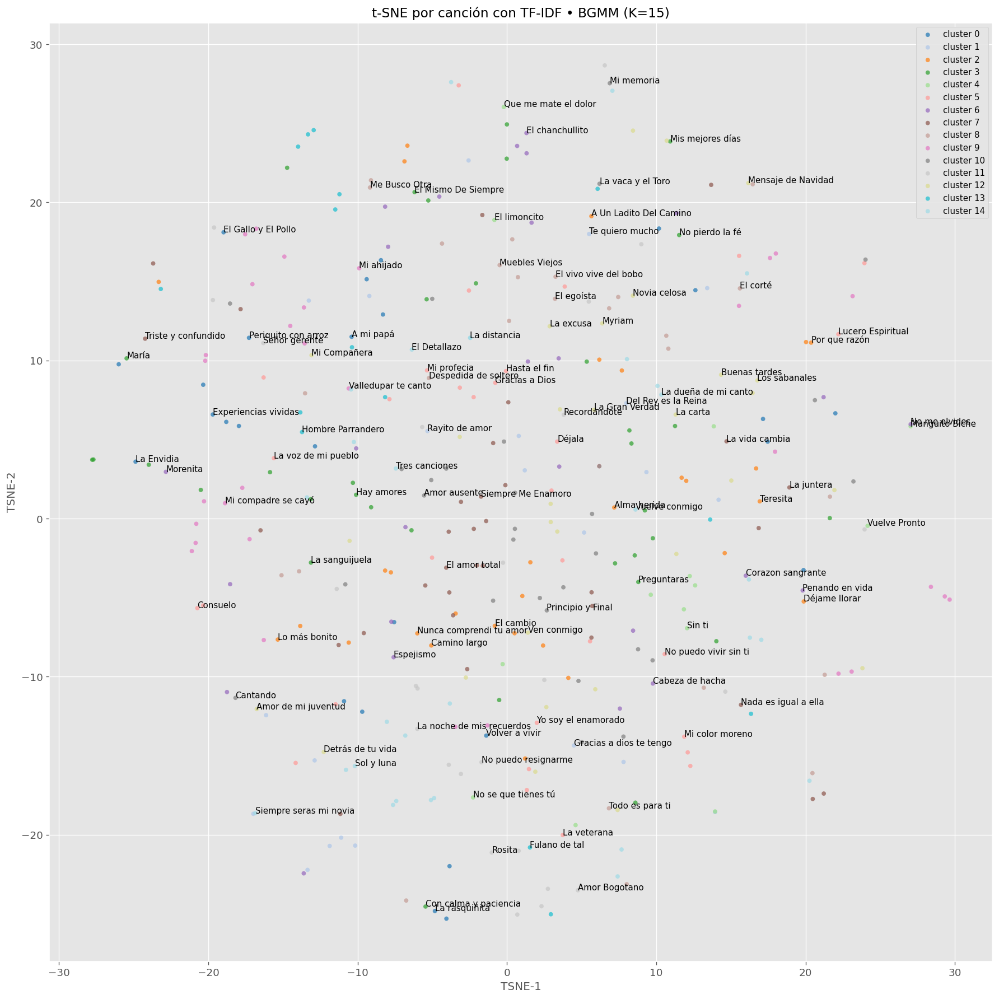

In [ ]:
# Usamos la variable T del t-SNE de TF-IDF
plot_tsne_clusters(T, song_names, labels_bgmm_tfidf,
                   title=f"t-SNE por canción con TF-IDF • BGMM (K={k_bgmm_tfidf})")

## Comparativa entre métricas de modelos (TF-IDF)

In [ ]:
# =========================================================
# 8) Comparativa de Métricas (TF-IDF)
# =========================================================
print("\n--- Comparativa de Métricas (Clustering sobre TF-IDF + SVD) ---")

# Recolectar todas las etiquetas de la sección TF-IDF
# (Usamos los nombres de variables definidos en esta sección)
metric_labels_tfidf = {
    "Spectral": (labels_spec, best['K']), # K de Spectral se re-calculó
    "AffinityProp": (labels_ap, n_clusters_ap),
    "BIRCH": (labels_birch, k_birch), # k_birch se calculó
    "K-Means": (labels_kmeans, k), # k=6
    "Jerárquico": (labels_hc, n_clusters_hc),
    "GMM": (labels_gmm_tfidf, best_k_gmm_tfidf),
    "BGMM": (labels_bgmm_tfidf, k_bgmm_tfidf)
}

results_tfidf = []
for name, (labels, K) in metric_labels_tfidf.items():
    if K < 2:
        print(f"Omitiendo {name} (K={K}, métricas requieren K >= 2)")
        continue

    sil = silhouette_score(Xn, labels, metric='cosine')
    db = davies_bouldin_score(Xn, labels)
    ch = calinski_harabasz_score(Xn, labels)

    results_tfidf.append({
        "Modelo": name,
        "K (clusters)": K,
        "Silhouette (↑)": sil,
        "Davies-Bouldin (↓)": db,
        "Calinski-Harabasz (↑)": ch
    })

df_metrics_tfidf = pd.DataFrame(results_tfidf).set_index("Modelo").sort_values("Silhouette (↑)", ascending=False)
display(df_metrics_tfidf)


--- Comparativa de Métricas (Clustering sobre TF-IDF + SVD) ---


,K (clusters),Silhouette (↑),Davies-Bouldin (↓),Calinski-Harabasz (↑)
Modelo,,,,
Spectral,97,0.082697,2.160590,2.228671
BIRCH,59,0.074499,2.494855,2.574637
AffinityProp,72,0.070984,2.360233,2.370516
GMM,7,0.019745,6.156167,3.617966
K-Means,6,0.019519,6.591704,3.764045
BGMM,15,0.014629,4.920562,2.548266
Jerárquico,6,0.001953,3.356331,2.478576


/tmp/ipython-input-2178626752.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


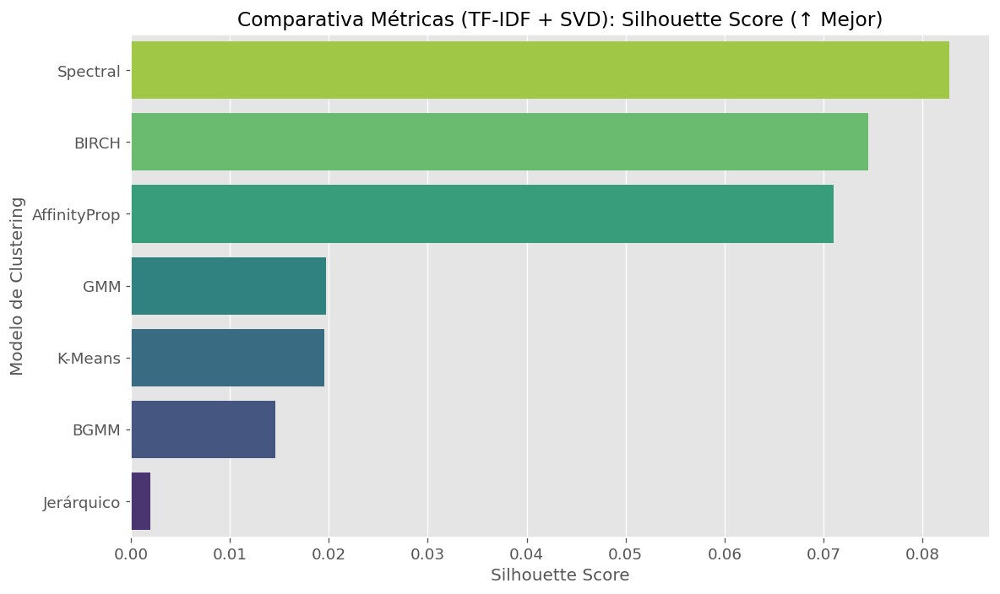

/tmp/ipython-input-2178626752.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


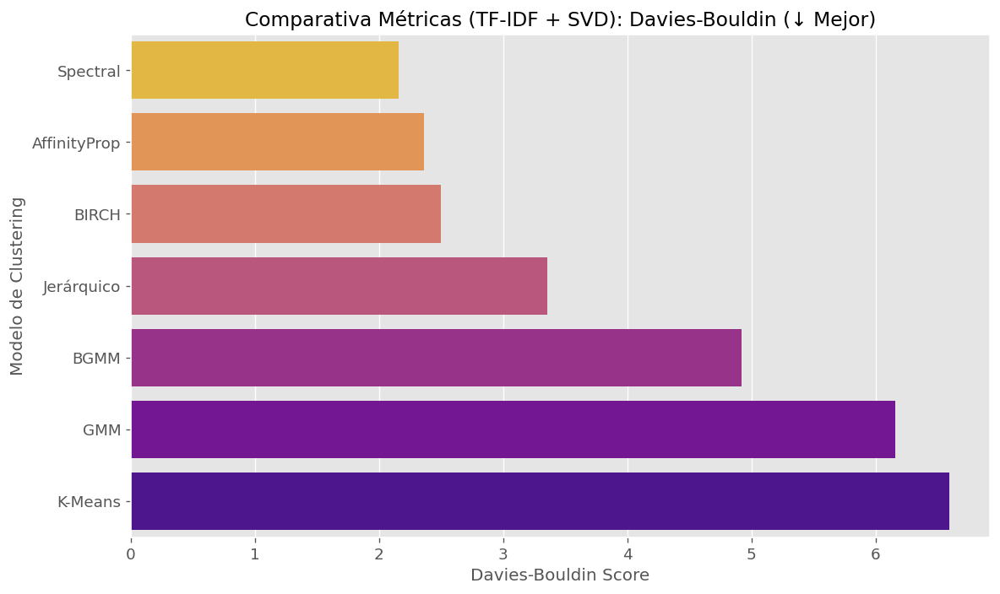

/tmp/ipython-input-2178626752.py:42: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


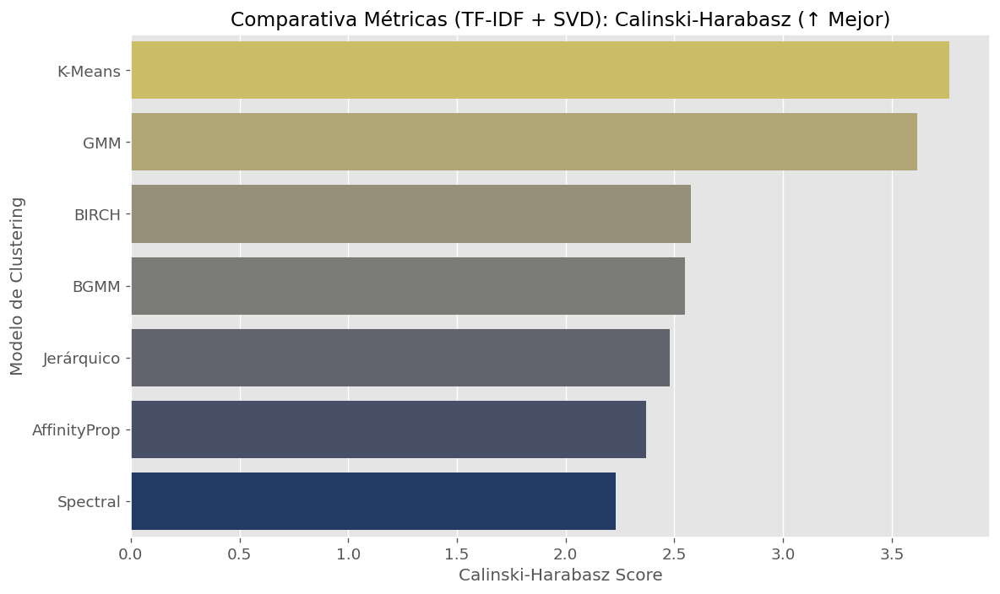

In [ ]:
# --- Gráfico 1: Silhouette Score (Mayor es Mejor) ---
# Asegúrate de que 'df_metrics_tfidf' exista de la celda anterior
df_plot_sil_tfidf = df_metrics_tfidf.reset_index().sort_values("Silhouette (↑)", ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(
    x="Silhouette (↑)",
    y="Modelo",
    data=df_plot_sil_tfidf,
    palette="viridis_r"
)
plt.title("Comparativa Métricas (TF-IDF + SVD): Silhouette Score (↑ Mejor)", fontsize=14)
plt.xlabel("Silhouette Score", fontsize=12)
plt.ylabel("Modelo de Clustering", fontsize=12)
plt.tight_layout()
plt.savefig("tfidf_metrics_silhouette.png")
plt.show()


# --- Gráfico 2: Davies-Bouldin Score (Menor es Mejor) ---
df_plot_db_tfidf = df_metrics_tfidf.reset_index().sort_values("Davies-Bouldin (↓)", ascending=True)

plt.figure(figsize=(10, 6))
sns.barplot(
    x="Davies-Bouldin (↓)",
    y="Modelo",
    data=df_plot_db_tfidf,
    palette="plasma_r"
)
plt.title("Comparativa Métricas (TF-IDF + SVD): Davies-Bouldin (↓ Mejor)", fontsize=14)
plt.xlabel("Davies-Bouldin Score", fontsize=12)
plt.ylabel("Modelo de Clustering", fontsize=12)
plt.tight_layout()
plt.savefig("tfidf_metrics_davies_bouldin.png")
plt.show()


# --- Gráfico 3: Calinski-Harabasz Score (Mayor es Mejor) ---
df_plot_ch_tfidf = df_metrics_tfidf.reset_index().sort_values("Calinski-Harabasz (↑)", ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(
    x="Calinski-Harabasz (↑)",
    y="Modelo",
    data=df_plot_ch_tfidf,
    palette="cividis_r"
)
plt.title("Comparativa Métricas (TF-IDF + SVD): Calinski-Harabasz (↑ Mejor)", fontsize=14)
plt.xlabel("Calinski-Harabasz Score", fontsize=12)
plt.ylabel("Modelo de Clustering", fontsize=12)
plt.tight_layout()
plt.savefig("tfidf_metrics_calinski_harabasz.png")
plt.show()

# Análisis de sentimiento por cluster

In [ ]:
# Instalación y dependencias
!pip install -q transformers

In [ ]:
import nltk
from nltk.tokenize import sent_tokenize
from transformers import pipeline
import warnings

In [ ]:
# Asegurarse que 'punkt' esté descargado para 'sent_tokenize'
try:
    nltk.data.find('tokenizers/punkt')
except LookupError:
    nltk.download('punkt')

nltk.download('punkt_tab')

# Cargar el pipeline
#    ¡Importante! Usamos 'return_all_scores=True'
#    para que nos devuelva las probabilidades de POS, NEG y NEU.
print("Cargando pipeline de Transformers (BETO)...")
sentiment_pipeline = pipeline(
    "sentiment-analysis",
    model="finiteautomata/beto-sentiment-analysis",
    return_all_scores=True
)
print("Pipeline de Transformers (BETO) cargado.")

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


Cargando pipeline de Transformers (BETO)...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/841 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/440M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/439M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/528 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

added_tokens.json:   0%|          | 0.00/67.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

Device set to use cpu


Pipeline de Transformers (BETO) cargado.


/usr/local/lib/python3.12/dist-packages/transformers/pipelines/text_classification.py:111: UserWarning: `return_all_scores` is now deprecated,  if want a similar functionality use `top_k=None` instead of `return_all_scores=True` or `top_k=1` instead of `return_all_scores=False`.
  warnings.warn(


In [ ]:
# Mapeo de etiquetas (el modelo BETO usa POS, NEG, NEU)
LABEL_MAP = {'POS': 0, 'NEG': 1, 'NEU': 2}
LABEL_LIST = ['POS', 'NEG', 'NEU']

def get_song_sentiment_scores_transformers(full_lyric_text, pipe):
    """
    Analiza una letra de canción larga usando el pipeline de Transformers.
    """
    if not isinstance(full_lyric_text, str) or not full_lyric_text.strip():
        # Etiqueta, score_pos, score_neg, score_neu
        return "NEU", 0.0, 0.0, 1.0

    # 1. Dividir en frases
    sentences = sent_tokenize(full_lyric_text)
    # Truncar frases muy largas (límite de 510) y quitar vacías
    sentences = [s[:510] for s in sentences if s.strip()]
    if not sentences:
        return "NEU", 0.0, 0.0, 1.0

    all_probas = []

    # Ocultar advertencias de 'truncation'
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        try:
            # 2. Analizar TODAS las frases en un batch
            # 'results_list' será una lista de listas de diccionarios
            # Ej: [ [{'label': 'NEG', 'score': 0.8}, {'label': 'POS', ...}], # Frase 1
            #       [{'label': 'NEU', 'score': 0.9}, ...] ]                 # Frase 2
            results_list = pipe(sentences, truncation=True)
        except Exception as e:
            # Error común si una frase es demasiado compleja para el modelo
            print(f"Error en el pipeline de Transformers: {e}")
            return "NEU", 0.0, 0.0, 1.0

    # Extraer y promediar probabilidades
    for sentence_result in results_list:
        # sentence_result = [{'label': 'NEG', 'score': 0.8}, {'label': 'POS', 'score': 0.1}, ...]
        probas = [0.0, 0.0, 0.0] # POS, NEG, NEU
        for res in sentence_result:
            # Encontrar el índice (0, 1, o 2) para la etiqueta
            label_index = LABEL_MAP.get(res['label'])
            if label_index is not None:
                probas[label_index] = res['score']
        all_probas.append(probas)

    if not all_probas:
         return "NEU", 0.0, 0.0, 1.0

    # Promediar las probabilidades de todas las frases
    avg_probas = np.mean(all_probas, axis=0)
    pos_score, neg_score, neu_score = avg_probas

    # Determinar la etiqueta final (la que tenga el score promedio más alto)
    final_label = LABEL_LIST[np.argmax(avg_probas)]

    return final_label, pos_score, neg_score, neu_score

In [ ]:
# Aplicar el análisis a TODO el DataFrame
# (Usa el df 'df' que contiene 'df_sin_dups' al inicio del script)
# ADVERTENCIA: ¡Esto tomará varios minutos!
print("Iniciando análisis de sentimiento de todas las canciones (hora del tinto o de la aromática)...")

# 'df' aquí es el DataFrame limpio (df_sin_dups)
sentiment_results = df['letra_completa'].apply(
    lambda x: get_song_sentiment_scores_transformers(x, sentiment_pipeline)
)
print("Análisis de sentimiento completado.")

# Añadir resultados al DataFrame
df_analysis = df.copy()
df_analysis['sentimiento'] = [res[0] for res in sentiment_results]
df_analysis['score_pos'] = [res[1] for res in sentiment_results]
df_analysis['score_neg'] = [res[2] for res in sentiment_results]
df_analysis['score_neu'] = [res[3] for res in sentiment_results]

# 6. Añadir las etiquetas del Cluster Ganador
#
#    *** ¡IMPORTANTE! ***
#    Usando las etiquetas de Spectral (Word2Vec)
#
try:
    df_analysis['cluster'] = labels_spec
except NameError:
    print("ERROR: La variable 'labels_spec' no se encontró.")
    print("Por favor, ejecuta primero la sección de Spectral Clustering (Word2Vec).")

Iniciando análisis de sentimiento de todas las canciones (hora del tinto o de la aromática)...
Análisis de sentimiento completado.


In [ ]:
# Análisis de 'groupby'
print("\n--- Resultados del Análisis de Sentimiento por Cluster ---")

# (Opción A) Conteo de canciones por cluster y sentimiento
cluster_sentiment_counts = df_analysis.groupby(['cluster', 'sentimiento']).size().unstack(fill_value=0)

print("\nConteo de Canciones (Sentimiento vs. Cluster):")
display(cluster_sentiment_counts)

# (Opción B) Scores promedio por cluster
cluster_sentiment_scores = df_analysis.groupby('cluster')[['score_pos', 'score_neg', 'score_neu']].mean()

print("\nScore Promedio de Sentimiento por Cluster:")
display(cluster_sentiment_scores)


--- Resultados del Análisis de Sentimiento por Cluster ---

Conteo de Canciones (Sentimiento vs. Cluster):


sentimiento,NEG,NEU,POS
cluster,,,
0,1,1,0
1,2,3,0
2,2,1,0
3,1,4,1
4,0,0,2
...,...,...,...
92,3,0,1
93,0,1,1
94,4,2,0



Score Promedio de Sentimiento por Cluster:


,score_pos,score_neg,score_neu
cluster,,,
0,0.101316,0.387706,0.510979
1,0.049394,0.409740,0.540865
2,0.046037,0.783944,0.170019
3,0.231892,0.217724,0.550384
4,0.536502,0.253444,0.210054
...,...,...,...
92,0.250330,0.723988,0.025682
93,0.415209,0.004991,0.579800
94,0.103101,0.580009,0.316890



--- Visualizaciones ---


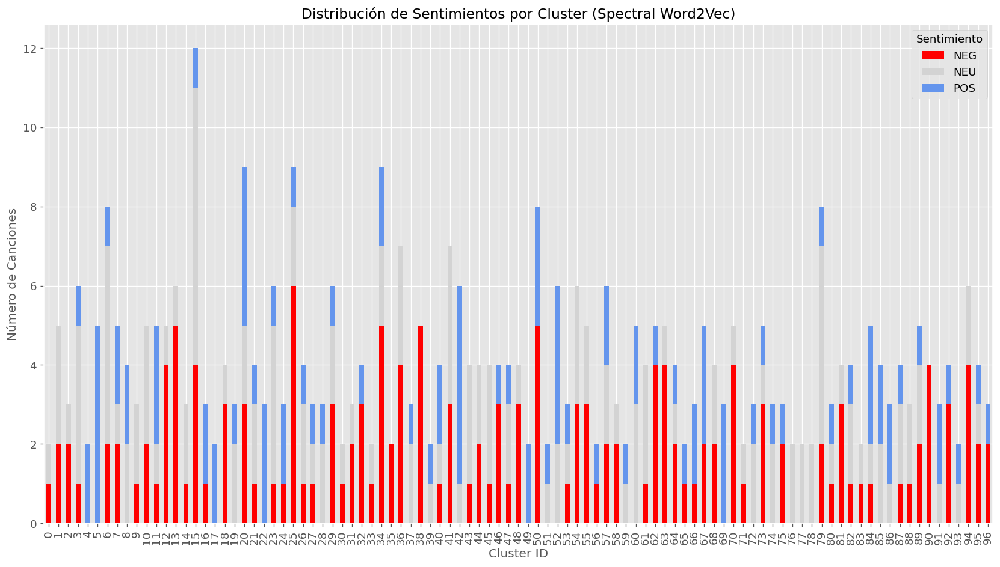

In [ ]:
# 8. Visualización de Resultados

print("\n--- Visualizaciones ---")

# Gráfico 1: Distribución de Sentimientos (Conteo)
# (Ordenamos las columnas para que NEG sea rojo, NEU gris, POS azul)
cluster_sentiment_counts = cluster_sentiment_counts.reindex(columns=['NEG', 'NEU', 'POS'])

cluster_sentiment_counts.plot(
    kind='bar',
    stacked=True,
    figsize=(14, 8),
    color=['red', 'lightgray', 'cornflowerblue'],
    title='Distribución de Sentimientos por Cluster (Spectral Word2Vec)'
)
plt.ylabel('Número de Canciones')
plt.xlabel('Cluster ID')
plt.legend(title='Sentimiento')
plt.tight_layout()
plt.savefig("cluster_sentiment_distribution.png")
plt.show()

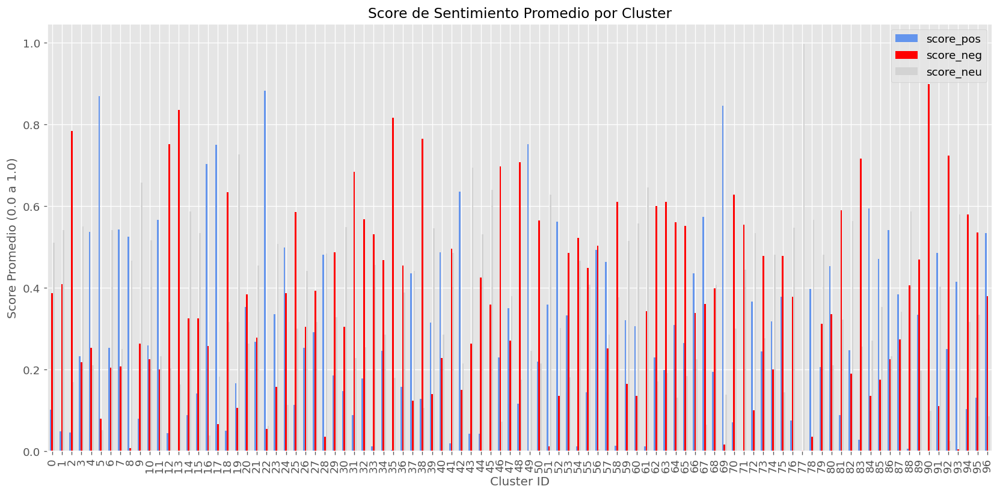

In [ ]:
# Gráfico 2: Scores Promedio
cluster_sentiment_scores.plot(
    kind='bar',
    figsize=(14, 7),
    color=['cornflowerblue', 'red', 'lightgray'],
    title='Score de Sentimiento Promedio por Cluster'
)
plt.ylabel('Score Promedio (0.0 a 1.0)')
plt.xlabel('Cluster ID')
plt.legend(loc='upper right')
plt.tight_layout()
plt.savefig("cluster_sentiment_scores_avg.png")
plt.show()


--- Generando Gráfico de Conteo Total de Sentimientos ---


/tmp/ipython-input-475548241.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(


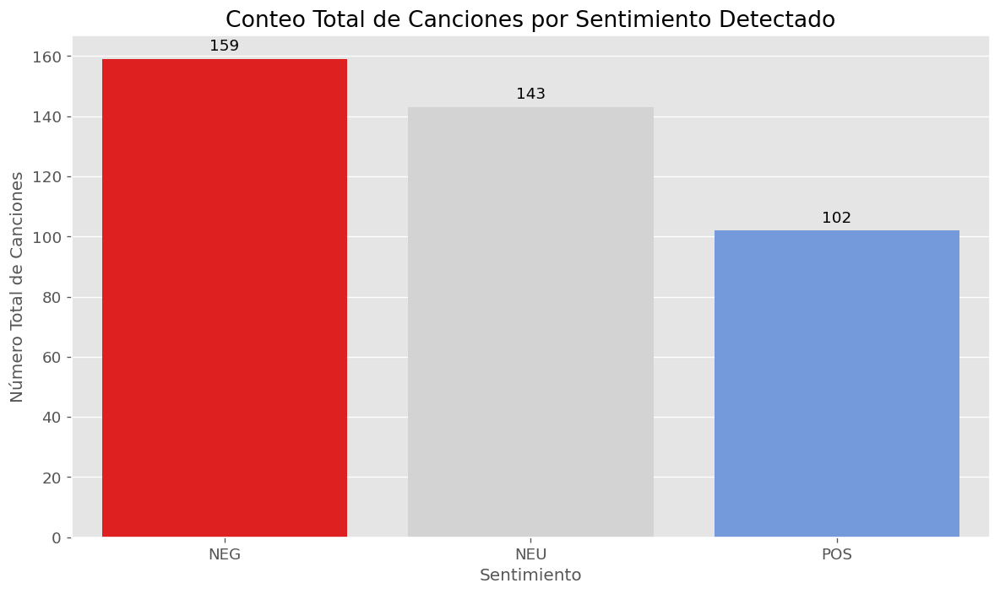

In [ ]:
if 'df_analysis' in locals():
    print("\n--- Generando Gráfico de Conteo Total de Sentimientos ---")

    plt.figure(figsize=(10, 6))

    # Definir el orden y los colores que hemos estado usando
    order_list = ['NEG', 'NEU', 'POS']
    palette_colors = {'NEG': 'red', 'NEU': 'lightgray', 'POS': 'cornflowerblue'}

    # Usar sns.countplot para contar automáticamente
    ax = sns.countplot(
        data=df_analysis,
        x='sentimiento',
        order=order_list,        # Asegurar el orden NEG, NEU, POS
        palette=palette_colors   # Aplicar la paleta de colores
    )

    # Añadir etiquetas de conteo encima de las barras para claridad
    for p in ax.patches:
        ax.annotate(f'{int(p.get_height())}',
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center',
                    xytext=(0, 9),
                    textcoords='offset points')

    plt.title('Conteo Total de Canciones por Sentimiento Detectado', fontsize=16)
    plt.xlabel('Sentimiento', fontsize=12)
    plt.ylabel('Número Total de Canciones', fontsize=12)
    plt.tight_layout()
    plt.savefig("total_sentiment_counts.png")
    plt.show()
else:
    print("Error: El DataFrame 'df_analysis' no se encontró.")
    print("Por favor, ejecuta primero el bloque de Análisis de Sentimiento.")

# LDA y LSA

## Preprocesamiento

Retomamos el dataframe sin canciones duplicadas definido al inicio

In [ ]:
df_lda = df_sin_dups.copy()

In [ ]:
df_lda.head()

,nombre_cancion,letra_completa
0,26 de mayo,el veintiséis del mes de mayo nació un niñito ...
1,A mi papá,voy a componé un merengue voy a componé un mer...
2,A un cariño del alma,cuando se acaban todas las palabras y ni siqui...
3,A un colega,de una manera especial y en una forma correcta...
4,A Un Ladito Del Camino,hoy me siento enamorado por eso he venido a ve...


Planteamos el proceso de limpieza de los datos, el consta consta de:
- Eliminación de stopwords.
- Normalización de vócales repetidas.
- Eliminación de tildes.
- Preprocesamiento general (similar al primero).

In [ ]:
# --- Construye stopwords para LDA en canciones (quita negaciones) ---
def stopwords_lda():
    stop_es = set(stopwords.words('spanish'))
    # Muletillas muy comunes en letras (amplía según tu corpus)
    adicionales = {
        'ay','oh','eh','ehh','uy','uyy','ayy','yeah','bebe','nena','mami','papi',
        'ohh','uh','uah','uhh','oye','dale','laa','aaa','ayyy','pa',
        'si', 'mas', 'tan', 'asi', 'tambien', 'amor', 'vida', 'va', 'voy', 'quiero', 'alma', 'siempre', 'corazon'
    }
    stop_es |= adicionales
    # Nota: NO removemos "no, nunca, sin, ni..." del stoplist => se eliminan (mejor para LDA)
    return stop_es

# --- Normalizadores útiles para letras ---
def normalizar_repeticiones(tok: str) -> str:
    # "amoooor" -> "amoor" (máx. 2 repeticiones seguidas)
    return re.sub(r'(.)\1{2,}', r'\1\1', tok)


def eliminar_tildes(text: str) -> str:
    """
    Elimina diacríticas de vocales (áéíóú/äëïöü → aeiou) y PRESERVA ñ/Ñ.
    """
    # Protege ñ/Ñ con marcadores temporales
    text = text.replace('ñ', '\uFFFF').replace('Ñ', '\uFFFE')
    # NFD separa letra base + marcas combinantes; quitamos las marcas (Mn)
    nf = unicodedata.normalize('NFD', text)
    no_marks = ''.join(ch for ch in nf if unicodedata.category(ch) != 'Mn')
    # Restaura ñ/Ñ
    no_marks = no_marks.replace('\uFFFF', 'ñ').replace('\uFFFE', 'Ñ')
    return no_marks

# --- Función principal de limpieza para LDA en canciones ---
def limpiar_texto_cancion_lda(texto, stop_words):
    """
    Preprocesamiento para LDA en letras:
    - minúsculas
    - normaliza risas y alargamientos
    - quita tildes de vocales (áéíóú/äëïöü → aeiou) y preserva ñ
    - elimina números, puntuación (incluye ¿¡) y espacios múltiples
    - elimina stopwords (incluye negaciones)
    - mantiene solo tokens alfabéticos de largo > 1
    """
    if not isinstance(texto, str):
        return ""
    t = texto.strip().lower()
    # quitar tildes/diaéresis de vocales (preservando ñ)
    t = eliminar_tildes(t)
    # quitar números
    t = re.sub(r"\d+", " ", t)
    # quitar puntuación estándar + signos ¿ ¡
    punct_extra = "¿¡"
    t = t.translate(str.maketrans('', '', string.punctuation + punct_extra))
    # normalizar espacios
    t = re.sub(r"\s+", " ", t).strip()
    # tokenizar, normalizar alargamientos, filtrar
    toks = [normalizar_repeticiones(tok) for tok in t.split()]
    toks = [tok for tok in toks if tok.isalpha() and len(tok) > 1 and tok not in stop_words]
    return " ".join(toks)

In [ ]:
stop_words_lda = stopwords_lda()
df_lda['frase_limpia'] = df_lda['letra_completa'].apply(lambda s: limpiar_texto_cancion_lda(s, stop_words_lda))

Las frases tras la limpieza se pueden ver en la columna 'frase_limpia'.

In [ ]:
df_lda.head()

,nombre_cancion,letra_completa,frase_limpia,tokens
0,26 de mayo,el veintiséis del mes de mayo nació un niñito ...,veintiseis mes mayo nacio niñito año cincuenta...,"[veintiseis, mes, mayo, nacio, niñito, año, ci..."
1,A mi papá,voy a componé un merengue voy a componé un mer...,compone merengue compone merengue cantarselo p...,"[voy, compone, merengue, voy, compone, merengu..."
2,A un cariño del alma,cuando se acaban todas las palabras y ni siqui...,acaban todas palabras siquiera puedes reprocha...,"[acaban, todas, palabras, siquiera, puedes, re..."
3,A un colega,de una manera especial y en una forma correcta...,manera especial forma correcta querido homenaj...,"[manera, especial, forma, correcta, querido, h..."
4,A Un Ladito Del Camino,hoy me siento enamorado por eso he venido a ve...,hoy siento enamorado venido verte aunque veas ...,"[hoy, siento, enamorado, venido, verte, aunque..."


Ahora, tokenizamos y construimos los diccionarios necesarios para aplicar LDA

In [ ]:
df_lda['tokens'] = df_lda['frase_limpia'].str.split()

In [ ]:
df_lda.head()

,nombre_cancion,letra_completa,frase_limpia,tokens
0,26 de mayo,el veintiséis del mes de mayo nació un niñito ...,veintiseis mes mayo nacio niñito año cincuenta...,"[veintiseis, mes, mayo, nacio, niñito, año, ci..."
1,A mi papá,voy a componé un merengue voy a componé un mer...,compone merengue compone merengue cantarselo p...,"[compone, merengue, compone, merengue, cantars..."
2,A un cariño del alma,cuando se acaban todas las palabras y ni siqui...,acaban todas palabras siquiera puedes reprocha...,"[acaban, todas, palabras, siquiera, puedes, re..."
3,A un colega,de una manera especial y en una forma correcta...,manera especial forma correcta querido homenaj...,"[manera, especial, forma, correcta, querido, h..."
4,A Un Ladito Del Camino,hoy me siento enamorado por eso he venido a ve...,hoy siento enamorado venido verte aunque veas ...,"[hoy, siento, enamorado, venido, verte, aunque..."


In [ ]:
from gensim import corpora

# Diccionario
dictionary = corpora.Dictionary(df_lda['tokens'])

# Filtrado de extremos: ajusta según tamaño del corpus
# - no_below: descarta palabras que aparecen en menos de X documentos
# - no_above: descarta palabras que aparecen en más del Y% de documentos
dictionary.filter_extremes(no_below=5, no_above=0.7)

# Corpus BoW
corpus = [dictionary.doc2bow(toks) for toks in df_lda['tokens']]

len(dictionary), len(corpus)

(1216, 404)

## LDA

Definimos la función de entrenamiento, la cual será utilizada para iterar en diferentes valores de k (número de clusters a encontrar).

In [ ]:
from gensim import models
from gensim.models import CoherenceModel

def entrenar_lda(corpus, dictionary, k, passes=15, iterations=400, random_state=42):
    return models.LdaModel(
        corpus=corpus,
        id2word=dictionary,
        num_topics=k,
        alpha='auto', eta='auto',
        passes=passes, iterations=iterations,
        random_state=random_state
    )

Ks = [2, 3, 5, 7, 10, 12, 15]  # ajusta el rango a tu gusto
modelos, coherencias = {}, {}

for k in Ks:
    lda_k = entrenar_lda(corpus, dictionary, k)
    cm = CoherenceModel(model=lda_k, texts=df_lda['tokens'],
                        dictionary=dictionary, coherence='c_v')
    modelos[k] = lda_k
    coherencias[k] = cm.get_coherence()

print("Coherencias C_v:", sorted(coherencias.items(), key=lambda x: x[1], reverse=True))
best_k = max(coherencias, key=coherencias.get)
lda = modelos[best_k]
print("Mejor K por C_v:", best_k, "→", coherencias[best_k])

Coherencias C_v: [(2, np.float64(0.31194924854007305)), (5, np.float64(0.3062945334581953)), (10, np.float64(0.3014051209116527)), (7, np.float64(0.298111856511123)), (12, np.float64(0.2980472462234857)), (3, np.float64(0.29390574539712705)), (15, np.float64(0.27725784540172466))]
Mejor K por C_v: 2 → 0.31194924854007305


A continuación, se ve la gráfica de los resultados de coherencia de los modelos entrenados. A partir de esta gráfica, se puede seleccionar el valor de K, siendo este el de mayor coherencia obtenida.

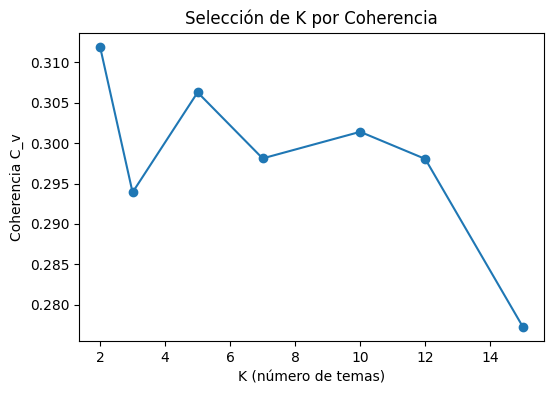

In [ ]:
ks = list(coherencias.keys())
vals = [coherencias[k] for k in ks]

plt.figure(figsize=(6,4))
plt.plot(ks, vals, marker='o')
plt.xlabel("K (número de temas)")
plt.ylabel("Coherencia C_v")
plt.title("Selección de K por Coherencia")
plt.show()

Ahora revisamos los temas capturados por el LDA para el valor de k con mayor coherencia.

In [ ]:
# Top palabras por tema
for i, tema in lda.show_topics(num_topics=best_k, num_words=10, formatted=False):
    print(i, [w for w, p in tema])

0 ['hombre', 'solo', 'dia', 'dios', 'hoy', 'mundo', 'compadre', 'cosas', 'pueblo', 'mujer']
1 ['mujer', 'dios', 'puedo', 'ser', 'hombre', 'solo', 'dia', 'feliz', 'bien', 'vivir']


En cuanto a los tópicos encontrados, parece que el primer tópico está relacionado con el hombre, Dios y el mundo; mientras que el tópico 1 está relacionado con la mujer, Dios y la felicidad.

Por otro lado, la distribución de las 5 primeras canciones según los clusters encontrados con LDA se puede visualizar a continuación:

In [ ]:
# Distribución de temas por documento (con 0s explícitos)
doc_topics = [lda.get_document_topics(bow, minimum_probability=0.0) for bow in corpus]
theta = pd.DataFrame(
    np.array([[p for _, p in doc] for doc in doc_topics]),
    columns=[f"topic_{i}" for i in range(best_k)]
)
theta['cancion'] = df_lda['nombre_cancion'].values
theta = theta[['cancion'] + [c for c in theta.columns if c.startswith('topic_')]]
theta.head()

,cancion,topic_0,topic_1
0,26 de mayo,0.998488,0.001512
1,A mi papá,0.998630,0.001370
2,A un cariño del alma,0.000913,0.999087
3,A un colega,0.998210,0.001790
4,A Un Ladito Del Camino,0.001375,0.998625


Tomando k=5, obtenemos:

In [ ]:
modelos

{2: <gensim.models.ldamodel.LdaModel at 0x7d3a4bec0560>,
 3: <gensim.models.ldamodel.LdaModel at 0x7d3a4c060b60>,
 5: <gensim.models.ldamodel.LdaModel at 0x7d3a4bf56a80>,
 7: <gensim.models.ldamodel.LdaModel at 0x7d3a4f870fe0>,
 10: <gensim.models.ldamodel.LdaModel at 0x7d3a4cd9e1b0>,
 12: <gensim.models.ldamodel.LdaModel at 0x7d3a4c0afe90>,
 15: <gensim.models.ldamodel.LdaModel at 0x7d3a4c422b70>}

In [ ]:
lda_5 = modelos[5]
# Top palabras por tema
for i, tema in lda_5.show_topics(num_topics=5, num_words=10, formatted=False):
    print(i, [w for w, p in tema])

0 ['pueblo', 'hoy', 'dios', 'aquel', 'mundo', 'ser', 'solo', 'dia', 'entonces', 'da']
1 ['dios', 'puedo', 'mujer', 'vivir', 'dia', 'ser', 'solo', 'ahora', 'vivo', 'feliz']
2 ['vas', 'deja', 'solo', 'quieres', 'dame', 'puedo', 'bien', 'dolor', 'puedes', 'adios']
3 ['hombre', 'solo', 'ser', 'dia', 'mujer', 'na', 'compadre', 'aqui', 'hombe', 'ahora']
4 ['mujer', 'hombre', 'dios', 'usted', 'bien', 'ser', 'mama', 'razon', 'hoy', 'dia']


En este caso, se puede observar una mayor diferenciación entre los tópicos.
- El tópico 0 parece hablar de pueblos, dios, el ser y del mundo.
- El tópico 1 habla de dios, la mujer y el ser feliz.
- El tópico 2 habla de dolor, dejar, soledad.
- El tópico 3 habla del hombre y la mujer, y puede estar relacionado con amor.
- El tópico 4 habla del hombre, la mujer, dios y de las madres.


In [ ]:
!pip -q install pyLDAvis

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 28.6 MB/s eta 0:00:00


In [ ]:
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()
panel = gensimvis.prepare(lda_5, corpus, dictionary)
panel  # se renderiza en Colab

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1     -0.042850  0.036409       1        1  27.096573
4     -0.010913 -0.025546       2        1  24.932027
0     -0.063158  0.075091       3        1  19.199935
3     -0.025176 -0.109030       4        1  14.840979
2      0.142097  0.023076       5        1  13.930486, topic_info=         Term       Freq       Total Category  logprob  loglift
518       vas  86.000000   86.000000  Default  30.0000  30.0000
323      deja  68.000000   68.000000  Default  29.0000  29.0000
711        na  46.000000   46.000000  Default  28.0000  28.0000
225      dame  56.000000   56.000000  Default  27.0000  27.0000
172  compadre  80.000000   80.000000  Default  26.0000  26.0000
..        ...        ...         ...      ...      ...      ...
60       aqui  22.733022  161.970632   Topic5  -5.1944   0.0075
274     ahora  22.545048  157.767975   Topic5  -5.2027   0.0255
82        mia  18.822989  116.679426   Topic5  -5.3831   0.1467
139      pena  18.083755   73.719848   Topic5  -5.4232   0.5658
209       mio  18.119656   94.711520   Topic5  -5.4212   0.3173

[361 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
472       1  0.090620   acaba
472       2  0.339824   acaba
472       3  0.475754   acaba
472       4  0.022655   acaba
472       5  0.090620   acaba
...     ...       ...     ...
317       1  0.209759  vuelvo
317       2  0.163146  vuelvo
317       3  0.139839  vuelvo
317       4  0.069920  vuelvo
317       5  0.442825  vuelvo

[955 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 5, 1, 4, 3])

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
/usr/local/lib/python3.12/dist-packag

## LSA

Aplicamos tf-idf

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import Normalizer
from sklearn.pipeline import make_pipeline

Utilizamos la vectorización Tf-Idf de la librería de sklearn.

In [ ]:
vectorizer = TfidfVectorizer(
    lowercase=False,
    token_pattern=r"(?u)\b\w+\b",
    min_df=5,           # descarta términos muy raros
    max_df=0.7          # descarta términos demasiado frecuentes
)

X = vectorizer.fit_transform(df_lda['frase_limpia'])
terms = np.array(vectorizer.get_feature_names_out())
print("Dimensión TF-IDF:", X.shape)

Dimensión TF-IDF: (404, 1216)


Definimos la función mediante la cuál iteraremos sobre diferentes valores de k el SVD, buscando una varianza explicada cercana o superior al 80%.

Varianza explicada por k: [(20, np.float64(0.1350287947543178)), (30, np.float64(0.19100351166171148)), (40, np.float64(0.24275066277054352)), (50, np.float64(0.2909235166897762)), (75, np.float64(0.3982962712411344)), (100, np.float64(0.4922470546332059)), (150, np.float64(0.6464925710865115)), (200, np.float64(0.7649301944596567))]


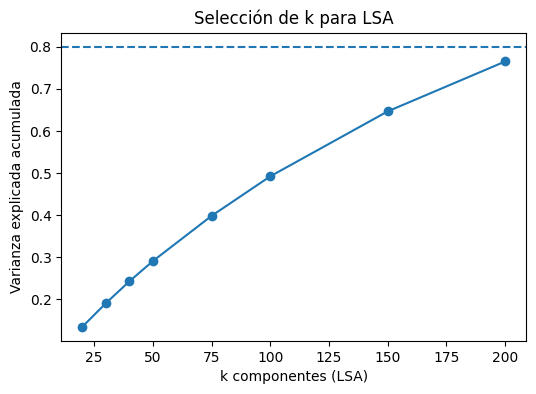

k elegido (LSA): 200


In [ ]:
def elegir_k_por_varianza(X, candidatos=(50, 75, 100, 150, 200), umbral=0.80, random_state=42):
    candidatos = [k for k in candidatos if k < min(X.shape)]  # k < min(#docs, #términos)
    resultados = []
    for k in candidatos:
        svd = TruncatedSVD(n_components=k, random_state=random_state)
        svd.fit(X)
        var = svd.explained_variance_ratio_.sum()
        resultados.append((k, var))
    # ordena por k
    resultados = sorted(resultados, key=lambda x: x[0])
    print("Varianza explicada por k:", resultados)

    # elige el k más pequeño que supera el umbral; si ninguno, el mayor
    elegidos = [k for k, v in resultados if v >= umbral]
    k_final = elegidos[0] if elegidos else resultados[-1][0]
    return k_final, resultados

k_lsa, tabla_var = elegir_k_por_varianza(X, candidatos=(20, 30, 40, 50, 75, 100, 150, 200), umbral=0.80)

# (Opcional) gráfica rápida
ks_plot = [k for k, _ in tabla_var]
vars_plot = [v for _, v in tabla_var]
plt.figure(figsize=(6,4))
plt.plot(ks_plot, vars_plot, marker='o')
plt.axhline(0.80, linestyle='--')
plt.xlabel("k componentes (LSA)")
plt.ylabel("Varianza explicada acumulada")
plt.title("Selección de k para LSA")
plt.show()

print("k elegido (LSA):", k_lsa)

Como se observa en la gráfica, aún reduciendo a 200 componentes no se logra explicar más del 80% de la varianza. No obstante, se continuará con 200 componentes para la aplicación de LSA.

In [ ]:
svd = TruncatedSVD(n_components=k_lsa, random_state=42)
lsa = make_pipeline(svd, Normalizer(copy=False))
X_lsa = lsa.fit_transform(X)  # matriz documento x k
var_total = svd.explained_variance_ratio_.sum()
print(f"Varianza explicada total con k={k_lsa}: {var_total:.3f}")

Varianza explicada total con k=200: 0.765


A continuación, se pueden observar los términso que pertenecen a cada una de las 200 componentes:

In [ ]:
def top_terms_por_componente(svd, terms, topn=12):
    comp = svd.components_  # shape (k, vocab)
    for i, row in enumerate(comp):
        idx = np.argsort(np.abs(row))[-topn:][::-1]
        print(f"[Comp {i}] ->", ", ".join(terms[idx]))

top_terms_por_componente(svd, terms, topn=12)

[Comp 0] -> mujer, hombre, dios, solo, ser, bien, dia, puedo, hoy, ahora, tiempo, mundo
[Comp 1] -> compadre, pueblo, papa, canto, hombre, gente, usted, vas, mama, diomedes, camino, feliz
[Comp 2] -> canto, pueblo, vas, papa, mama, usted, canciones, luna, valledupar, compadre, deja, ser
[Comp 3] -> mujer, hombre, papa, morena, bien, adios, alla, aqui, mama, sabes, pueblo, camino
[Comp 4] -> vas, luna, usted, puedes, mio, papa, mama, compadre, aqui, boca, cuerpo, bien
[Comp 5] -> puedo, negra, linda, bien, vivir, papa, hombre, alegre, sido, reina, camino, bonita
[Comp 6] -> ser, pueda, mio, aqui, vas, luna, usted, conmigo, dame, quieres, puedo, feliz
[Comp 7] -> puedo, compadre, mama, bien, papa, mia, mundo, acaba, cariño, importa, vive, paloma
[Comp 8] -> mio, dios, mujeres, dame, vivo, mia, compadre, mundo, usted, favor, vas, mujer
[Comp 9] -> mio, mama, dios, da, papa, pueblo, vas, aqui, sol, pueda, hombre, toda
[Comp 10] -> ven, hago, dame, hombre, penas, aqui, luna, mia, vas, puede

Las componentes, dado que captan cerca del 80% de la varianza, muestran diferentes patrones semánticos. Por ejemplo, la primera componente habla de amor, vida, dios, etc; mientras que otros como el 55 y 56 hablan de bailar, fiesta, dolor, etc.

In [ ]:
theta_lsa = pd.DataFrame(X_lsa, columns=[f"comp_{i}" for i in range(k_lsa)])
theta_lsa['cancion'] = df_lda['nombre_cancion'].values if 'nombre_cancion' in df_lda.columns else df_lda.index.astype(str)
cols = ['cancion'] + [c for c in theta_lsa.columns if c.startswith('comp_')]
theta_lsa = theta_lsa[cols]

A continuación, se puede observar la representación de las canciones en las 200 componentes del LSA.

In [ ]:
theta_abs = theta_lsa.copy()
for c in theta_abs.columns[1:]:
    theta_abs[c] = theta_abs[c].abs()

# Primeros documentos
theta_lsa.head()
theta_abs.head()

,cancion,comp_0,comp_1,comp_2,comp_3,comp_4,comp_5,comp_6,comp_7,comp_8,...,comp_190,comp_191,comp_192,comp_193,comp_194,comp_195,comp_196,comp_197,comp_198,comp_199
0,26 de mayo,0.289930,0.198099,0.242260,0.158627,0.060985,0.128461,0.101170,0.054157,0.026943,...,0.048990,0.007184,0.001119,0.118729,0.054752,0.090777,0.016248,0.029459,0.009405,0.015645
1,A mi papá,0.284000,0.321680,0.011487,0.186478,0.130409,0.169402,0.030813,0.159161,0.104654,...,0.037536,0.008912,0.001597,0.087502,0.005188,0.070819,0.009634,0.048040,0.039010,0.022030
2,A un cariño del alma,0.271135,0.105938,0.146792,0.019056,0.004148,0.014475,0.094588,0.160453,0.006670,...,0.038039,0.115676,0.025357,0.014361,0.039483,0.047262,0.025112,0.007446,0.035757,0.055659
3,A un colega,0.222253,0.270889,0.258797,0.158002,0.051424,0.012357,0.040849,0.011087,0.039189,...,0.020162,0.030953,0.034903,0.020450,0.000704,0.078645,0.058451,0.012044,0.004588,0.015872
4,A Un Ladito Del Camino,0.223139,0.154484,0.007694,0.089840,0.033246,0.076360,0.066462,0.005533,0.130771,...,0.023577,0.048295,0.040806,0.031536,0.024605,0.059692,0.063444,0.037750,0.007090,0.011873


Adicionalmente, con la función 'top_temas_por_documento' podemos analizar las componentes principales relacionadas a cada canción y así, podemos analizar sus temáticas.

In [ ]:
def top_temas_por_documento(theta_abs, topn=3):
    out = []
    comps = [c for c in theta_abs.columns if c.startswith('comp_')]
    for _, row in theta_abs.iterrows():
        can = row['cancion']
        scores = row[comps].values
        top_idx = np.argsort(scores)[-topn:][::-1]
        out.append((can, [(comps[i], float(scores[i])) for i in top_idx]))
    return out

ejemplo_top = top_temas_por_documento(theta_abs, topn=3)[:5]
for can, tops in ejemplo_top:
    print(can, "->", tops)

26 de mayo -> [('comp_0', 0.28992994872266964), ('comp_2', 0.2422596046575441), ('comp_1', 0.19809876838034368)]
A mi papá -> [('comp_1', 0.3216803223844823), ('comp_0', 0.284000114361603), ('comp_15', 0.19931145376040152)]
A un cariño del alma -> [('comp_0', 0.2711352848455387), ('comp_9', 0.19716239868330565), ('comp_28', 0.188806942290323)]
A un colega -> [('comp_1', 0.2708886731766606), ('comp_2', 0.2587971385545571), ('comp_0', 0.222252972715198)]
A Un Ladito Del Camino -> [('comp_0', 0.22313929375212826), ('comp_24', 0.19979355011226568), ('comp_91', 0.19904147512850254)]


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

cv = CountVectorizer(
    lowercase=False,
    token_pattern=r"(?u)\b\w+\b",
    min_df=5,
    max_df=0.7
)
Xc = cv.fit_transform(df_lda['frase_limpia'])
terms = np.array(cv.get_feature_names_out())
freq = np.asarray(Xc.sum(axis=0)).ravel()

top = 30
ranking = (pd.DataFrame({"termino": terms, "frecuencia": freq})
             .sort_values("frecuencia", ascending=False)
             .head(top))
print(ranking)


      termino  frecuencia
329      dios         273
709     mujer         264
523    hombre         256
1046     solo         240
303       dia         219
1016      ser         215
908     puedo         197
109      bien         185
528       hoy         180
67       aqui         168
26      ahora         163
1085   tiempo         159
712     mundo         154
431     feliz         151
1028   siento         144
749     nunca         139
1199     vivo         137
1196    vivir         136
201   conmigo         125
339     dolor         122
662       mia         121
935    quiere         115
63      aquel         114
223     cosas         113
163    cariño         111
647     mejor         110
1167      vez         110
249        da         108
815     penas         107
486      hace         105
